In [1]:
!pip install ucimlrepo


In [35]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from ucimlrepo import fetch_ucirepo
from scipy.stats import pointbiserialr
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, plot_confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC

In [3]:
breast_cancer = fetch_ucirepo(id=17)
breast_cancer

{'data': {'ids':            ID
  0      842302
  1      842517
  2    84300903
  3    84348301
  4    84358402
  ..        ...
  564    926424
  565    926682
  566    926954
  567    927241
  568     92751
  
  [569 rows x 1 columns],
  'features':      radius1  texture1  perimeter1   area1  smoothness1  compactness1  \
  0      17.99     10.38      122.80  1001.0      0.11840       0.27760   
  1      20.57     17.77      132.90  1326.0      0.08474       0.07864   
  2      19.69     21.25      130.00  1203.0      0.10960       0.15990   
  3      11.42     20.38       77.58   386.1      0.14250       0.28390   
  4      20.29     14.34      135.10  1297.0      0.10030       0.13280   
  ..       ...       ...         ...     ...          ...           ...   
  564    21.56     22.39      142.00  1479.0      0.11100       0.11590   
  565    20.13     28.25      131.20  1261.0      0.09780       0.10340   
  566    16.60     28.08      108.30   858.1      0.08455       0.10230   
  

In [4]:
type(breast_cancer)

ucimlrepo.dotdict.dotdict

In [5]:
X = breast_cancer.data.features
X.head()

,radius1,texture1,perimeter1,area1,smoothness1,compactness1,concavity1,concave_points1,symmetry1,fractal_dimension1,...,radius3,texture3,perimeter3,area3,smoothness3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [44]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 30 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   radius1             569 non-null    float64
 1   texture1            569 non-null    float64
 2   perimeter1          569 non-null    float64
 3   area1               569 non-null    float64
 4   smoothness1         569 non-null    float64
 5   compactness1        569 non-null    float64
 6   concavity1          569 non-null    float64
 7   concave_points1     569 non-null    float64
 8   symmetry1           569 non-null    float64
 9   fractal_dimension1  569 non-null    float64
 10  radius2             569 non-null    float64
 11  texture2            569 non-null    float64
 12  perimeter2          569 non-null    float64
 13  area2               569 non-null    float64
 14  smoothness2         569 non-null    float64
 15  compactness2        569 non-null    float64
 16  concavit

In [6]:
y = breast_cancer.data.targets
y.head()

,Diagnosis
0,M
1,M
2,M
3,M
4,M


In [7]:
y.loc[:,'Diagnosis'] = y['Diagnosis'].map({'M':1, 'B':0})
y.head()

C:\Users\sraba\anaconda3\lib\site-packages\pandas\core\indexing.py:1843: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item_labels[indexer[info_axis]]] = value


,Diagnosis
0,1
1,1
2,1
3,1
4,1


In [8]:
y['Diagnosis'] = y['Diagnosis'].astype(int)

<ipython-input-8-e7ff89811fdf>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['Diagnosis'] = y['Diagnosis'].astype(int)


In [9]:
X.isnull().sum()

radius1               0
texture1              0
perimeter1            0
area1                 0
smoothness1           0
compactness1          0
concavity1            0
concave_points1       0
symmetry1             0
fractal_dimension1    0
radius2               0
texture2              0
perimeter2            0
area2                 0
smoothness2           0
compactness2          0
concavity2            0
concave_points2       0
symmetry2             0
fractal_dimension2    0
radius3               0
texture3              0
perimeter3            0
area3                 0
smoothness3           0
compactness3          0
concavity3            0
concave_points3       0
symmetry3             0
fractal_dimension3    0
dtype: int64

In [10]:
y.isnull().sum()

Diagnosis    0
dtype: int64

In [11]:
X.shape

(569, 30)

In [12]:
y.shape

(569, 1)

In [13]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
radius1,569.0,14.127292,3.524049,6.981000,11.700000,13.370000,15.780000,28.11000
texture1,569.0,19.289649,4.301036,9.710000,16.170000,18.840000,21.800000,39.28000
perimeter1,569.0,91.969033,24.298981,43.790000,75.170000,86.240000,104.100000,188.50000
area1,569.0,654.889104,351.914129,143.500000,420.300000,551.100000,782.700000,2501.00000
smoothness1,569.0,0.096360,0.014064,0.052630,0.086370,0.095870,0.105300,0.16340
compactness1,569.0,0.104341,0.052813,0.019380,0.064920,0.092630,0.130400,0.34540
concavity1,569.0,0.088799,0.079720,0.000000,0.029560,0.061540,0.130700,0.42680
concave_points1,569.0,0.048919,0.038803,0.000000,0.020310,0.033500,0.074000,0.20120
symmetry1,569.0,0.181162,0.027414,0.106000,0.161900,0.179200,0.195700,0.30400
fractal_dimension1,569.0,0.062798,0.007060,0.049960,0.057700,0.061540,0.066120,0.09744


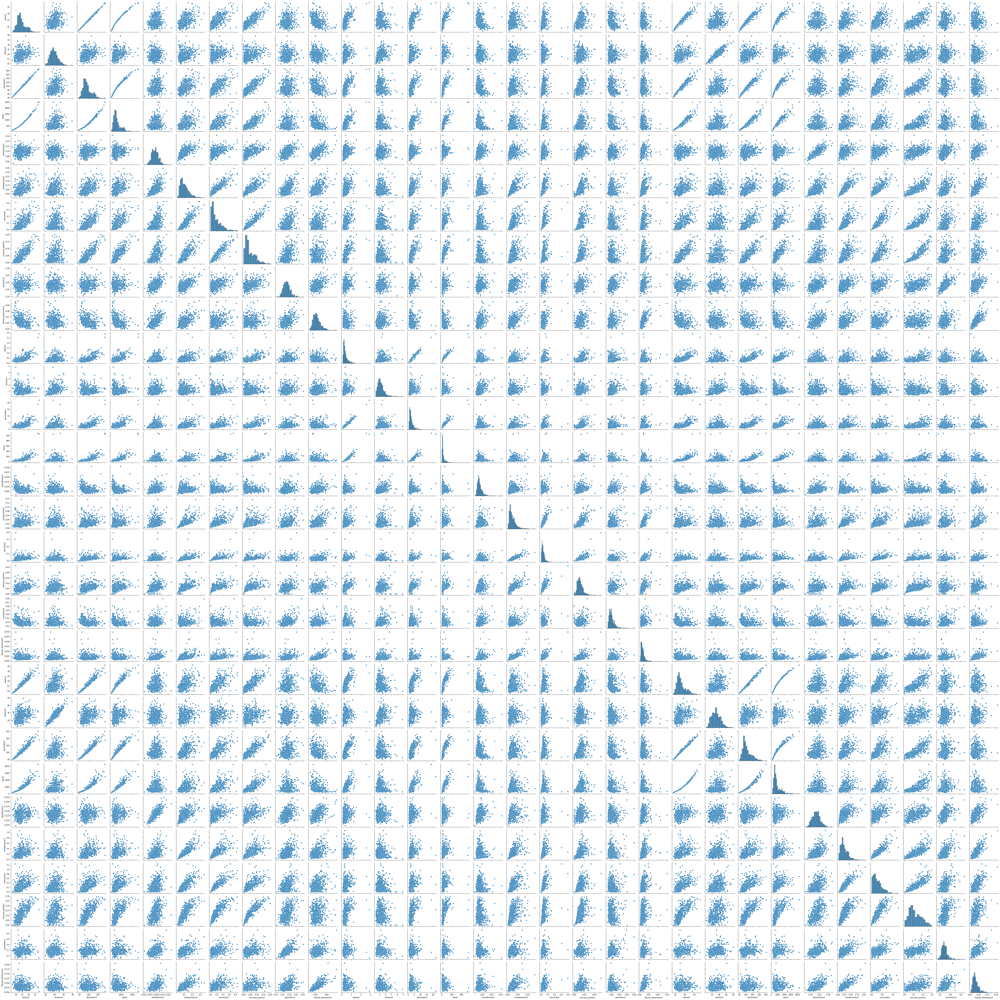

In [39]:
sns.pairplot(X)

<AxesSubplot:xlabel='Diagnosis', ylabel='count'>

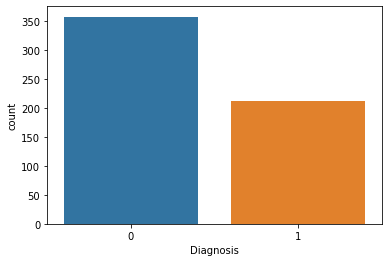

In [14]:
sns.countplot(x='Diagnosis',data=y)

In [15]:
X_y = X.copy()
X_y['Diagnosis'] = y['Diagnosis']
X_y.head()

,radius1,texture1,perimeter1,area1,smoothness1,compactness1,concavity1,concave_points1,symmetry1,fractal_dimension1,...,texture3,perimeter3,area3,smoothness3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3,Diagnosis
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,1
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,1
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,1
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,1
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,1


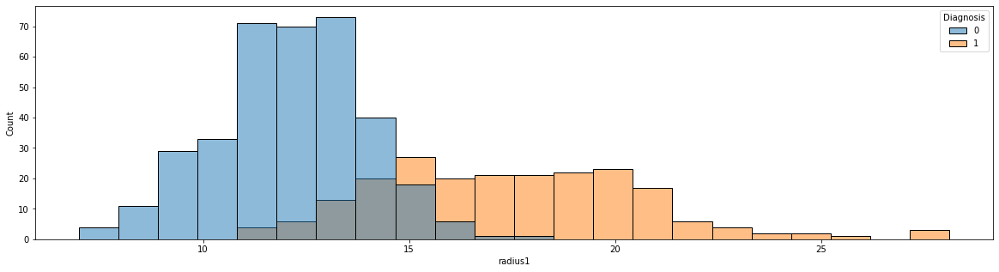

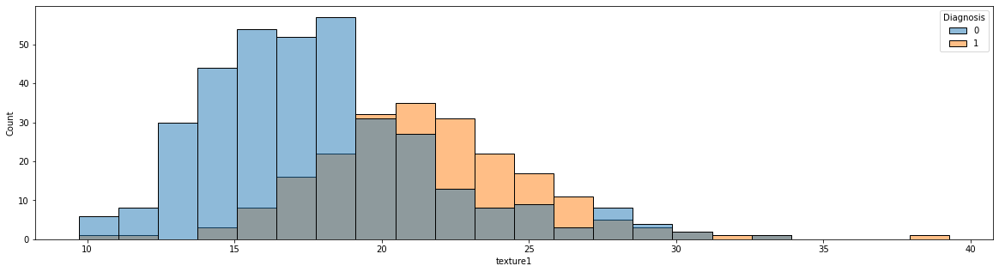

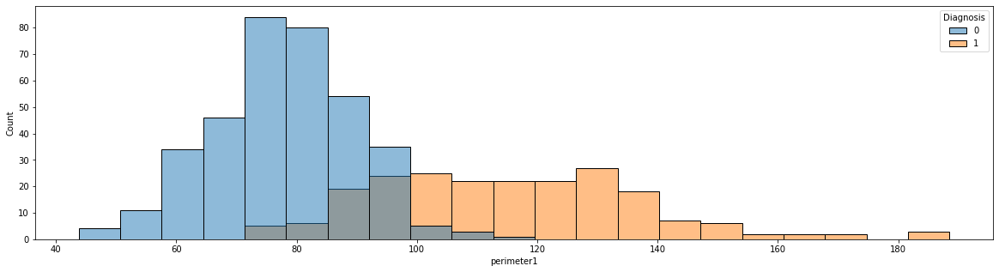

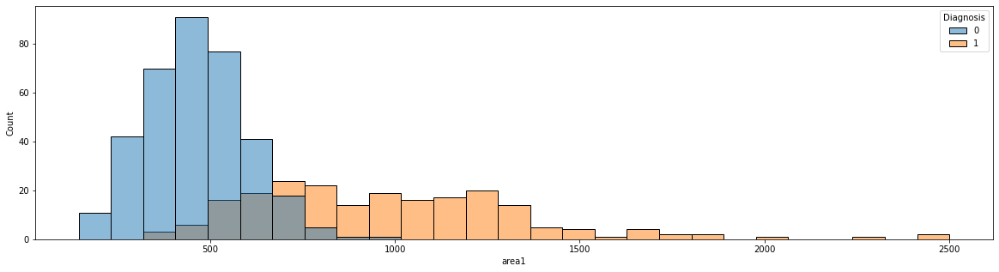

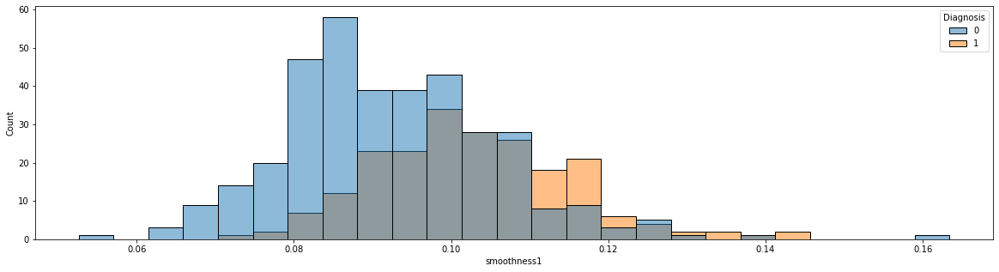

...

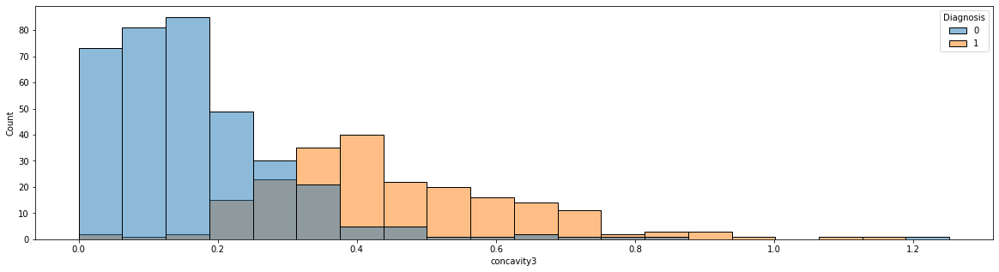

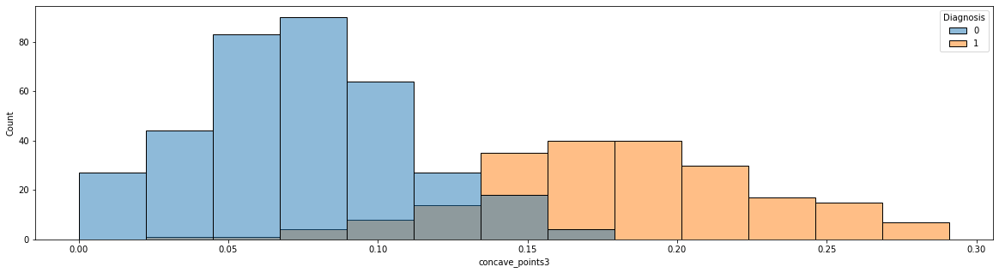

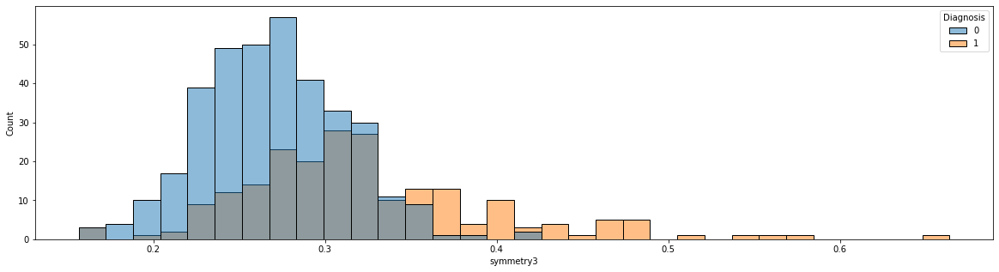

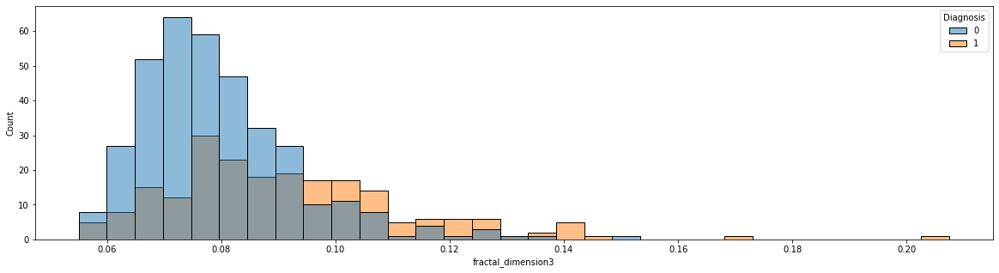

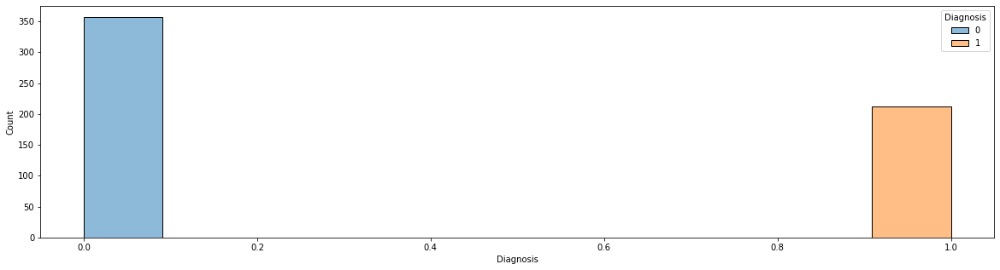

In [16]:
for col in X_y.columns:
    fig,axes=plt.subplots(1,1,figsize=(20,5))
    sns.histplot(data=X_y,x=X_y[col],hue='Diagnosis')
    plt.show()

<AxesSubplot:>

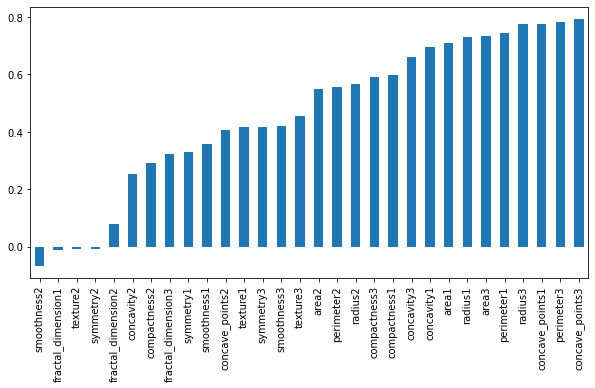

In [17]:
# Find the point-bi-serial correlation between each feature and diagnosis
correlations = {}
p_values = {}
for col in X_y.columns.drop('Diagnosis'):
    correlation, p_value = pointbiserialr(X_y[col],X_y['Diagnosis'])
    correlations[col] = correlation
    p_values[col] = p_value
    
# Convert to a series for plotting
correlations_series = pd.Series(correlations)
p_values_series = pd.Series(p_values)

# Plotting histogram
correlations_series.sort_values().plot(kind='bar',figsize=(10,5))


<AxesSubplot:>

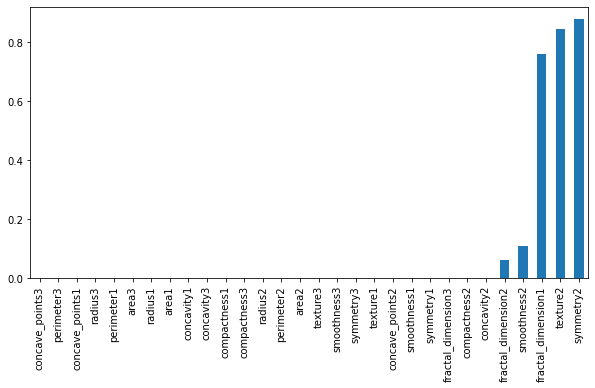

In [18]:
p_values_series.sort_values().plot(kind='bar',figsize=(10,5))

<AxesSubplot:>

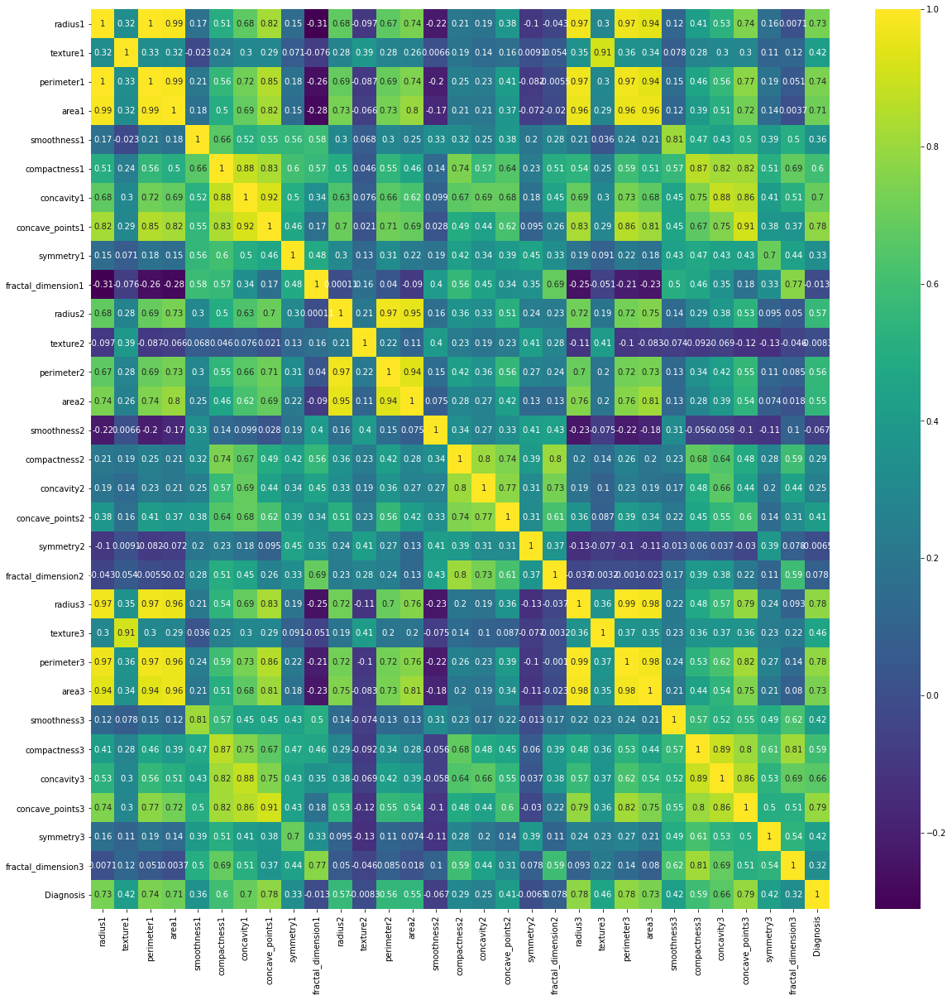

In [19]:
plt.figure(figsize=(20,20))
sns.heatmap(X_y.corr(),cmap='viridis',annot=True)

## Using Various Models To Find Out Which Model Gives Better Accuracy

In [20]:
X = X_y.drop('Diagnosis', axis=1)
y = X_y['Diagnosis']

In [21]:
# Split data into train-test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

# Creating a function to experiment with hyperparameters
def report_model(model):
    model.fit(X_train,y_train)
    model_prediction = model.predict(X_test)
    print(classification_report(y_test, model_prediction))
    plot_confusion_matrix(model,X_test,y_test)
    accuracy_score(y_test,model_prediction)

### Default Decision Tree Classifier

              precision    recall  f1-score   support

           0       0.93      0.94      0.93       105
           1       0.91      0.88      0.89        66

    accuracy                           0.92       171
   macro avg       0.92      0.91      0.91       171
weighted avg       0.92      0.92      0.92       171



,Feature Importance
radius1,0.000000
texture1,0.016226
perimeter1,0.000000
area1,0.000000
smoothness1,0.000000
compactness1,0.012981
concavity1,0.008313
concave_points1,0.000000
symmetry1,0.009015
fractal_dimension1,0.000000


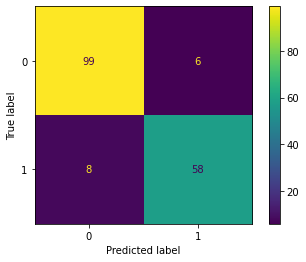

In [25]:
model_DT = DecisionTreeClassifier()
report_model(model_DT)
pd.DataFrame(index=X.columns,data=model_DT.feature_importances_,columns=['Feature Importance'])

### Testing Various Hyperparameters of a Decision Tree

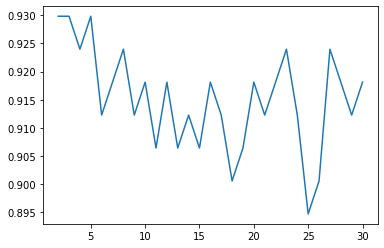

In [26]:
# Max-Depth
accuracy_scores = []
for i in range(2,31):
    pruned_decision_tree = DecisionTreeClassifier(max_depth=i)
    pruned_decision_tree.fit(X_train,y_train)
    y_predicted = pruned_decision_tree.predict(X_test)
    accuracy_scores.append(accuracy_score(y_test,y_predicted))
plt.plot(range(2,31),accuracy_scores)

#### Conclusion -- it seems like we are reaching an accuracy of approximately 92% with a maximum depth of 5

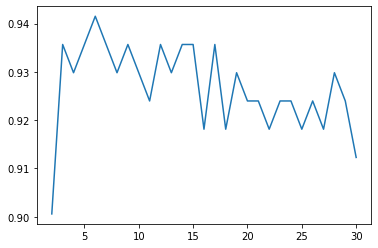

In [27]:
# Max leaf nodes
accuracy_scores = []
for i in range(2,31):
    pruned_decision_tree = DecisionTreeClassifier(max_depth=5,max_leaf_nodes=i)
    pruned_decision_tree.fit(X_train,y_train)
    y_predicted = pruned_decision_tree.predict(X_test)
    accuracy_scores.append(accuracy_score(y_test,y_predicted))
plt.plot(range(2,31),accuracy_scores)


#### Conclusion -- here also, it seems we are reaching the accuracy limit of 93% with maximum leaf nodes of 5 or less. 

              precision    recall  f1-score   support

           0       0.94      0.93      0.94       105
           1       0.90      0.91      0.90        66

    accuracy                           0.92       171
   macro avg       0.92      0.92      0.92       171
weighted avg       0.92      0.92      0.92       171



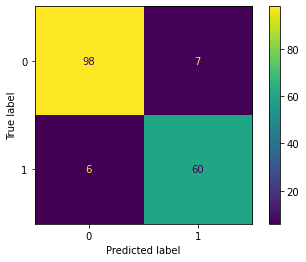

In [28]:
# Criterion -- Entropy
entropy_DT = DecisionTreeClassifier(criterion='entropy')
report_model(entropy_DT)

#### Observation -- entropy decision tree seems to have a better accuracy compared to gini decision tree

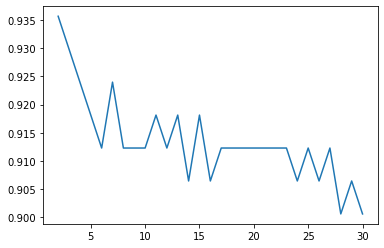

In [29]:
# Max-Depth
accuracy_scores = []
for i in range(2,31):
    pruned_entropy_decision_tree = DecisionTreeClassifier(max_depth=i)
    pruned_entropy_decision_tree.fit(X_train,y_train)
    y_predicted = pruned_entropy_decision_tree.predict(X_test)
    accuracy_scores.append(accuracy_score(y_test,y_predicted))
plt.plot(range(2,31),accuracy_scores)

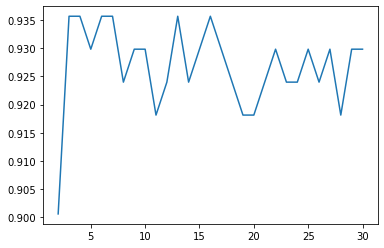

In [30]:
# Max leaf nodes
accuracy_scores = []
for i in range(2,31):
    pruned_entropy_decision_tree = DecisionTreeClassifier(max_depth=5,max_leaf_nodes=i)
    pruned_entropy_decision_tree.fit(X_train,y_train)
    y_predicted = pruned_entropy_decision_tree.predict(X_test)
    accuracy_scores.append(accuracy_score(y_test,y_predicted))
plt.plot(range(2,31),accuracy_scores)


#### Conclusion -- for entropy also, it seems a max-dept and max-leaf-nodes of 5 will be sufficient to create the model. 

## Decision Tree with entropy and max-depth = 5, max-leaf-nodes = 5

              precision    recall  f1-score   support

           0       0.95      0.94      0.95       105
           1       0.91      0.92      0.92        66

    accuracy                           0.94       171
   macro avg       0.93      0.93      0.93       171
weighted avg       0.94      0.94      0.94       171



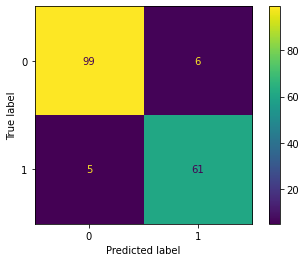

In [31]:
final_DT_model = DecisionTreeClassifier(criterion='entropy',max_depth=5, max_leaf_nodes=6)
report_model(final_DT_model)

## Random Forest

In [33]:
n_estimators=[20,40,60,80,100]
max_features= [5,10,15,20,25,30, 'sqrt', 'log2']
bootstrap = [True,False]
oob_score = [True,False]
criterion = ['gini','entropy', 'log_loss']

param_grid = {'n_estimators':n_estimators,
             'max_features':max_features,
             'bootstrap':bootstrap,
             'oob_score':oob_score,
             'criterion':criterion}

rfc = RandomForestClassifier()
grid = GridSearchCV(rfc,param_grid)
grid.fit(X_train,y_train)


print(f"Best parameters are {grid.best_params_}")

# Predictions and Accuracy
# y_predicted = grid.predict(X_test)
# print(classification_report(y_test,y_predicted))
# plot_confusion_matrix(grid,X_test,y_test)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:541: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:545: RuntimeWarning: invalid value encountered in true_divide
  decision = (predictions[k] /
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:541: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:545: RuntimeWarning: invalid value encountered in true_divide
  decision = (predictions[k] /
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:541: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were 

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 352, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sraba\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\sraba\anaconda3\lib\site-packages\joblib\parallel.py", line 777, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)

Best parameters are {'bootstrap': False, 'criterion': 'entropy', 'max_features': 'log2', 'n_estimators': 60, 'oob_score': False}


#### Conclusion -- the best parameters are {'bootstrap': False, 'criterion': 'entropy', 'max_features': 'log2', 'n_estimators': 60, 'oob_score': False}

              precision    recall  f1-score   support

           0       0.97      0.97      0.97       105
           1       0.95      0.95      0.95        66

    accuracy                           0.96       171
   macro avg       0.96      0.96      0.96       171
weighted avg       0.96      0.96      0.96       171



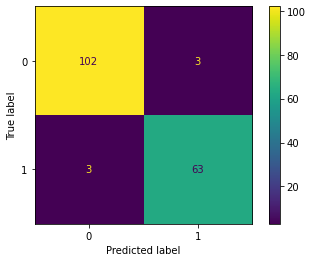

In [34]:
rfc = RandomForestClassifier(n_estimators=60,bootstrap=False,max_features='log2',criterion='entropy',oob_score=False)
rfc.fit(X_train,y_train)
y_predicted = rfc.predict(X_test)
print(classification_report(y_test,y_predicted))
plot_confusion_matrix(rfc,X_test,y_test)

              precision    recall  f1-score   support

           0       0.96      0.97      0.97       105
           1       0.95      0.94      0.95        66

    accuracy                           0.96       171
   macro avg       0.96      0.96      0.96       171
weighted avg       0.96      0.96      0.96       171



<ipython-input-102-c333ad0778e9>:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc.fit(X_train,y_train)


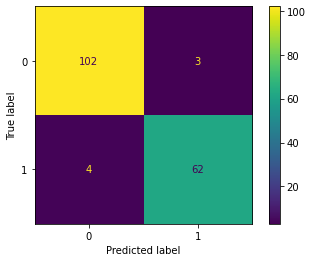

In [102]:
rfc = RandomForestClassifier(n_estimators=80,bootstrap=True,max_features=5,oob_score=True)
rfc.fit(X_train,y_train)
y_predicted = rfc.predict(X_test)
print(classification_report(y_test,y_predicted))
plot_confusion_matrix(rfc,X_test,y_test)

## Support Vector Machine

              precision    recall  f1-score   support

           0       0.95      0.93      0.94       107
           1       0.89      0.92      0.91        64

    accuracy                           0.93       171
   macro avg       0.92      0.93      0.93       171
weighted avg       0.93      0.93      0.93       171



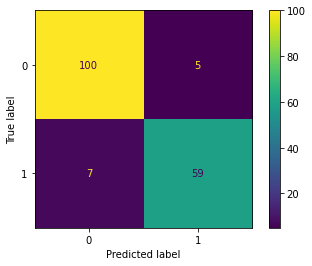

In [24]:
svm_model = SVC(class_weight='balanced', C=10000)
svm_model.fit(X_train, y_train)
y_predicted = svm_model.predict(X_test)
print(classification_report(y_predicted, y_test))
plot_confusion_matrix(svm_model,X_test,y_test)

              precision    recall  f1-score   support

           0       0.94      0.95      0.95       104
           1       0.92      0.91      0.92        67

    accuracy                           0.94       171
   macro avg       0.93      0.93      0.93       171
weighted avg       0.94      0.94      0.94       171



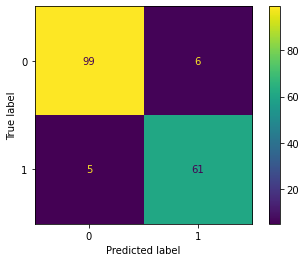

In [26]:
svm_model = SVC(class_weight='balanced', C=1000)
svm_model.fit(X_train, y_train)
y_predicted = svm_model.predict(X_test)
print(classification_report(y_predicted, y_test))
plot_confusion_matrix(svm_model,X_test,y_test)

              precision    recall  f1-score   support

           0       0.94      0.93      0.93       107
           1       0.88      0.91      0.89        64

    accuracy                           0.92       171
   macro avg       0.91      0.92      0.91       171
weighted avg       0.92      0.92      0.92       171



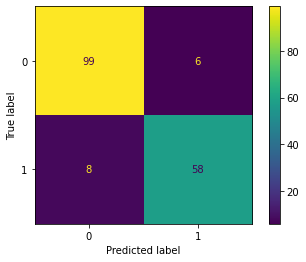

In [27]:
svm_model = SVC(class_weight='balanced', C=100)
svm_model.fit(X_train, y_train)
y_predicted = svm_model.predict(X_test)
print(classification_report(y_predicted, y_test))
plot_confusion_matrix(svm_model,X_test,y_test)

              precision    recall  f1-score   support

           0       1.00      0.61      0.76       171
           1       0.00      0.00      0.00         0

    accuracy                           0.61       171
   macro avg       0.50      0.31      0.38       171
weighted avg       1.00      0.61      0.76       171



C:\Users\sraba\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\sraba\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


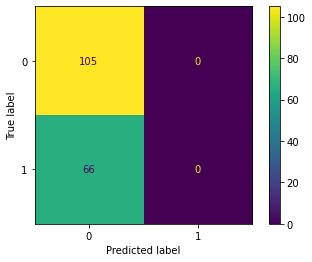

In [29]:
svm_model = SVC(class_weight='balanced', C=1000, gamma='auto')
svm_model.fit(X_train, y_train)
y_predicted = svm_model.predict(X_test)
print(classification_report(y_predicted, y_test))
plot_confusion_matrix(svm_model,X_test,y_test)

              precision    recall  f1-score   support

           0       0.97      0.94      0.95       109
           1       0.89      0.95      0.92        62

    accuracy                           0.94       171
   macro avg       0.93      0.94      0.94       171
weighted avg       0.94      0.94      0.94       171



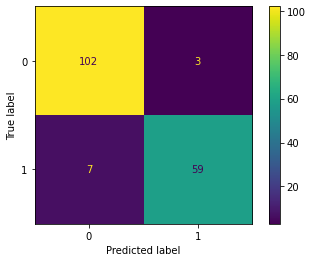

In [30]:
svm_model = SVC(class_weight='balanced', C=1000, kernel='linear')
svm_model.fit(X_train, y_train)
y_predicted = svm_model.predict(X_test)
print(classification_report(y_predicted, y_test))
plot_confusion_matrix(svm_model,X_test,y_test)

              precision    recall  f1-score   support

           0       0.25      0.36      0.29        73
           1       0.29      0.19      0.23        98

    accuracy                           0.26       171
   macro avg       0.27      0.28      0.26       171
weighted avg       0.27      0.26      0.26       171



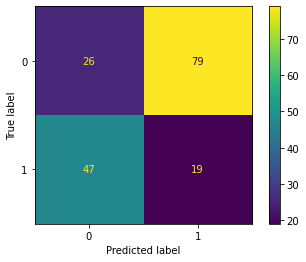

In [31]:
svm_model = SVC(class_weight='balanced', C=1000, kernel='sigmoid')
svm_model.fit(X_train, y_train)
y_predicted = svm_model.predict(X_test)
print(classification_report(y_predicted, y_test))
plot_confusion_matrix(svm_model,X_test,y_test)

              precision    recall  f1-score   support

           0       0.94      0.93      0.94       106
           1       0.89      0.91      0.90        65

    accuracy                           0.92       171
   macro avg       0.92      0.92      0.92       171
weighted avg       0.92      0.92      0.92       171



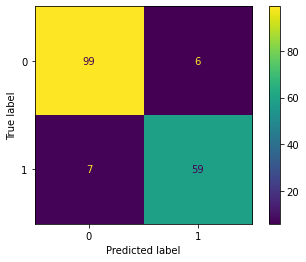

In [32]:
svm_model = SVC(class_weight='balanced', C=1000, kernel='poly')
svm_model.fit(X_train, y_train)
y_predicted = svm_model.predict(X_test)
print(classification_report(y_predicted, y_test))
plot_confusion_matrix(svm_model,X_test,y_test)

In [41]:
# Computer cannot handle this and thus tried individually above. 
# param_grid_svm = {'C':[10000, 1000, 100], 'kernel':['rbf','linear','sigmoid','poly'], 'gamma':['scale','auto']}
# grid_svm = GridSearchCV(svm_model, param_grid_svm)
# grid_svm.fit(X_train,y_train)
# grid_svm.best_params_

#### Conclusion -- seems like a SVM of C = 1000, class_weights = balanced and everything else set to default worked best. 

## Logistic Regression

              precision    recall  f1-score   support

           0       0.97      0.94      0.95       109
           1       0.89      0.95      0.92        62

    accuracy                           0.94       171
   macro avg       0.93      0.94      0.94       171
weighted avg       0.94      0.94      0.94       171



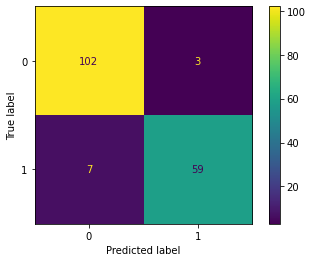

In [40]:
logistic_model = LogisticRegression(max_iter=10000)
logistic_model.fit(X_train, y_train)
y_logistic_model_predicted = logistic_model.predict(X_test)
print(classification_report(y_logistic_model_predicted, y_test))
plot_confusion_matrix(logistic_model,X_test,y_test)

              precision    recall  f1-score   support

           0       0.99      0.95      0.97       110
           1       0.91      0.98      0.94        61

    accuracy                           0.96       171
   macro avg       0.95      0.96      0.96       171
weighted avg       0.96      0.96      0.96       171



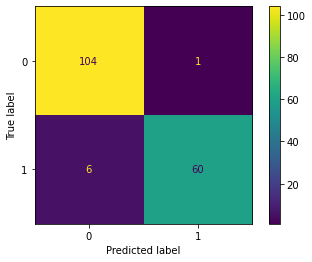

In [42]:
logisticCV_model = LogisticRegressionCV(max_iter=10000)
logisticCV_model.fit(X_train, y_train)
y_logisticCV_model_predicted = logisticCV_model.predict(X_test)
print(classification_report(y_logisticCV_model_predicted, y_test))
plot_confusion_matrix(logisticCV_model,X_test,y_test)

In [55]:
import tensorflow as tf

# Create the ANN
ann = tf.keras.models.Sequential()

# Add the first hidden layer
ann.add(tf.keras.layers.Dense(units=30, activation='relu'))

# Add the second hidden layer
ann.add(tf.keras.layers.Dense(units=30, activation='relu'))

# Add the output layer
ann.add(tf.keras.layers.Dense(units=1, activation='sigmoid'))

# Compile ANN
ann.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train ANN on training set
ann.fit(X_train, y_train, batch_size=32, epochs=10000)

# Predicting the test set
y_pred = ann.predict(X_test)


Epoch 1/10000

If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.

13/13 [==============================] - 0s 998us/step - loss: 6.6459 - accuracy: 0.5251
Epoch 2/10000
13/13 [==============================] - 0s 843us/step - loss: 3.0028 - accuracy: 0.7513
Epoch 3/10000
13/13 [==============================] - 0s 903us/step - loss: 2.8341 - accuracy: 0.6809
Epoch 4/10000
13/13 [==============================] - 0s 815us/step - loss: 1.8957 - accuracy: 0.7563
Epoch 5/10000
13/13 [==============================] - 0s 842us/step - loss: 1.2681 - accuracy: 

13/13 [==============================] - 0s 593us/step - loss: 0.4591 - accuracy: 0.8693
Epoch 71/10000
13/13 [==============================] - 0s 690us/step - loss: 0.1762 - accuracy: 0.9322
Epoch 72/10000
13/13 [==============================] - 0s 690us/step - loss: 0.2524 - accuracy: 0.9121
Epoch 73/10000
13/13 [==============================] - 0s 649us/step - loss: 0.2086 - accuracy: 0.9271
Epoch 74/10000
13/13 [==============================] - 0s 689us/step - loss: 0.1778 - accuracy: 0.9271
Epoch 75/10000
13/13 [==============================] - 0s 614us/step - loss: 0.1817 - accuracy: 0.9271
Epoch 76/10000
13/13 [==============================] - 0s 614us/step - loss: 0.2259 - accuracy: 0.9196
Epoch 77/10000
13/13 [==============================] - 0s 614us/step - loss: 0.2628 - accuracy: 0.9070
Epoch 78/10000
13/13 [==============================] - 0s 622us/step - loss: 0.1923 - accuracy: 0.9221
Epoch 79/10000
13/13 [==============================] - 0s 537us/step - loss: 0

13/13 [==============================] - 0s 572us/step - loss: 0.1599 - accuracy: 0.9372
Epoch 149/10000
13/13 [==============================] - 0s 616us/step - loss: 0.2299 - accuracy: 0.9070
Epoch 150/10000
13/13 [==============================] - 0s 614us/step - loss: 0.2075 - accuracy: 0.9221
Epoch 151/10000
13/13 [==============================] - 0s 537us/step - loss: 0.1695 - accuracy: 0.9221
Epoch 152/10000
13/13 [==============================] - 0s 614us/step - loss: 0.1721 - accuracy: 0.9523
Epoch 153/10000
13/13 [==============================] - 0s 541us/step - loss: 0.1188 - accuracy: 0.9497
Epoch 154/10000
13/13 [==============================] - 0s 614us/step - loss: 0.1448 - accuracy: 0.9523
Epoch 155/10000
13/13 [==============================] - 0s 614us/step - loss: 0.1373 - accuracy: 0.9422
Epoch 156/10000
13/13 [==============================] - 0s 650us/step - loss: 0.1648 - accuracy: 0.9347
Epoch 157/10000
13/13 [==============================] - 0s 571us/step 

13/13 [==============================] - 0s 623us/step - loss: 0.3296 - accuracy: 0.8945
Epoch 227/10000
13/13 [==============================] - 0s 614us/step - loss: 0.3296 - accuracy: 0.9070
Epoch 228/10000
13/13 [==============================] - 0s 613us/step - loss: 0.4223 - accuracy: 0.8970
Epoch 229/10000
13/13 [==============================] - 0s 649us/step - loss: 0.3189 - accuracy: 0.9196
Epoch 230/10000
13/13 [==============================] - 0s 614us/step - loss: 0.1422 - accuracy: 0.9472
Epoch 231/10000
13/13 [==============================] - 0s 544us/step - loss: 0.1606 - accuracy: 0.9497
Epoch 232/10000
13/13 [==============================] - 0s 614us/step - loss: 0.1305 - accuracy: 0.9447
Epoch 233/10000
13/13 [==============================] - 0s 537us/step - loss: 0.2223 - accuracy: 0.9472
Epoch 234/10000
13/13 [==============================] - 0s 731us/step - loss: 0.1625 - accuracy: 0.9497
Epoch 235/10000
13/13 [==============================] - 0s 614us/step 

13/13 [==============================] - 0s 624us/step - loss: 0.1717 - accuracy: 0.9422
Epoch 305/10000
13/13 [==============================] - 0s 689us/step - loss: 0.1936 - accuracy: 0.9146
Epoch 306/10000
13/13 [==============================] - 0s 611us/step - loss: 0.1236 - accuracy: 0.9523
Epoch 307/10000
13/13 [==============================] - 0s 616us/step - loss: 0.1101 - accuracy: 0.9573
Epoch 308/10000
13/13 [==============================] - 0s 610us/step - loss: 0.1413 - accuracy: 0.9447
Epoch 309/10000
13/13 [==============================] - 0s 646us/step - loss: 0.1076 - accuracy: 0.9573
Epoch 310/10000
13/13 [==============================] - 0s 623us/step - loss: 0.0936 - accuracy: 0.9623
Epoch 311/10000
13/13 [==============================] - 0s 650us/step - loss: 0.1094 - accuracy: 0.9573
Epoch 312/10000
13/13 [==============================] - 0s 654us/step - loss: 0.1924 - accuracy: 0.9171
Epoch 313/10000
13/13 [==============================] - 0s 537us/step 

13/13 [==============================] - 0s 537us/step - loss: 0.0959 - accuracy: 0.9648
Epoch 383/10000
13/13 [==============================] - 0s 533us/step - loss: 0.1486 - accuracy: 0.9447
Epoch 384/10000
13/13 [==============================] - 0s 563us/step - loss: 0.1344 - accuracy: 0.9523
Epoch 385/10000
13/13 [==============================] - 0s 615us/step - loss: 0.0801 - accuracy: 0.9573
Epoch 386/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0808 - accuracy: 0.9623
Epoch 387/10000
13/13 [==============================] - 0s 532us/step - loss: 0.0807 - accuracy: 0.9623
Epoch 388/10000
13/13 [==============================] - 0s 649us/step - loss: 0.1274 - accuracy: 0.9497
Epoch 389/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0820 - accuracy: 0.9673
Epoch 390/10000
13/13 [==============================] - 0s 537us/step - loss: 0.1314 - accuracy: 0.9523
Epoch 391/10000
13/13 [==============================] - 0s 537us/step 

13/13 [==============================] - 0s 635us/step - loss: 0.1655 - accuracy: 0.9397
Epoch 461/10000
13/13 [==============================] - 0s 614us/step - loss: 0.1490 - accuracy: 0.9372
Epoch 462/10000
13/13 [==============================] - 0s 539us/step - loss: 0.1049 - accuracy: 0.9598
Epoch 463/10000
13/13 [==============================] - 0s 537us/step - loss: 0.2253 - accuracy: 0.9271
Epoch 464/10000
13/13 [==============================] - 0s 666us/step - loss: 0.3177 - accuracy: 0.8844
Epoch 465/10000
13/13 [==============================] - 0s 579us/step - loss: 0.1684 - accuracy: 0.9397
Epoch 466/10000
13/13 [==============================] - 0s 611us/step - loss: 0.1013 - accuracy: 0.9523
Epoch 467/10000
13/13 [==============================] - 0s 583us/step - loss: 0.1367 - accuracy: 0.9497
Epoch 468/10000
13/13 [==============================] - 0s 539us/step - loss: 0.1115 - accuracy: 0.9573
Epoch 469/10000
13/13 [==============================] - 0s 612us/step 

13/13 [==============================] - 0s 635us/step - loss: 0.0641 - accuracy: 0.9698
Epoch 539/10000
13/13 [==============================] - 0s 639us/step - loss: 0.0644 - accuracy: 0.9724
Epoch 540/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0820 - accuracy: 0.9724
Epoch 541/10000
13/13 [==============================] - 0s 612us/step - loss: 0.1122 - accuracy: 0.9623
Epoch 542/10000
13/13 [==============================] - 0s 614us/step - loss: 0.1442 - accuracy: 0.9548
Epoch 543/10000
13/13 [==============================] - 0s 616us/step - loss: 0.0682 - accuracy: 0.9698
Epoch 544/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0629 - accuracy: 0.9623
Epoch 545/10000
13/13 [==============================] - 0s 765us/step - loss: 0.0672 - accuracy: 0.9648
Epoch 546/10000
13/13 [==============================] - 0s 690us/step - loss: 0.1289 - accuracy: 0.9447
Epoch 547/10000
13/13 [==============================] - 0s 767us/step 

13/13 [==============================] - 0s 614us/step - loss: 0.0784 - accuracy: 0.9623
Epoch 617/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0962 - accuracy: 0.9623
Epoch 618/10000
13/13 [==============================] - 0s 690us/step - loss: 0.1849 - accuracy: 0.9523
Epoch 619/10000
13/13 [==============================] - 0s 614us/step - loss: 0.1696 - accuracy: 0.9422
Epoch 620/10000
13/13 [==============================] - 0s 613us/step - loss: 0.0937 - accuracy: 0.9774
Epoch 621/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0759 - accuracy: 0.9724
Epoch 622/10000
13/13 [==============================] - 0s 612us/step - loss: 0.0702 - accuracy: 0.9648
Epoch 623/10000
13/13 [==============================] - 0s 577us/step - loss: 0.0670 - accuracy: 0.9673
Epoch 624/10000
13/13 [==============================] - 0s 612us/step - loss: 0.0656 - accuracy: 0.9623
Epoch 625/10000
13/13 [==============================] - 0s 612us/step 

13/13 [==============================] - 0s 614us/step - loss: 0.0608 - accuracy: 0.9673
Epoch 695/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0616 - accuracy: 0.9774
Epoch 696/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0583 - accuracy: 0.9774
Epoch 697/10000
13/13 [==============================] - 0s 607us/step - loss: 0.1199 - accuracy: 0.9573
Epoch 698/10000
13/13 [==============================] - 0s 604us/step - loss: 0.1840 - accuracy: 0.9422
Epoch 699/10000
13/13 [==============================] - 0s 614us/step - loss: 0.1899 - accuracy: 0.9347
Epoch 700/10000
13/13 [==============================] - 0s 610us/step - loss: 0.1698 - accuracy: 0.9322
Epoch 701/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0934 - accuracy: 0.9648
Epoch 702/10000
13/13 [==============================] - 0s 616us/step - loss: 0.0965 - accuracy: 0.9623
Epoch 703/10000
13/13 [==============================] - 0s 537us/step 

13/13 [==============================] - 0s 537us/step - loss: 0.0509 - accuracy: 0.9724
Epoch 773/10000
13/13 [==============================] - 0s 516us/step - loss: 0.1063 - accuracy: 0.9548
Epoch 774/10000
13/13 [==============================] - 0s 612us/step - loss: 0.1045 - accuracy: 0.9523
Epoch 775/10000
13/13 [==============================] - 0s 537us/step - loss: 0.1546 - accuracy: 0.9472
Epoch 776/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0964 - accuracy: 0.9673
Epoch 777/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0734 - accuracy: 0.9698
Epoch 778/10000
13/13 [==============================] - 0s 578us/step - loss: 0.0708 - accuracy: 0.9698
Epoch 779/10000
13/13 [==============================] - 0s 688us/step - loss: 0.0880 - accuracy: 0.9623
Epoch 780/10000
13/13 [==============================] - 0s 546us/step - loss: 0.1465 - accuracy: 0.9548
Epoch 781/10000
13/13 [==============================] - 0s 690us/step 

13/13 [==============================] - 0s 606us/step - loss: 0.0548 - accuracy: 0.9749
Epoch 851/10000
13/13 [==============================] - 0s 525us/step - loss: 0.0811 - accuracy: 0.9648
Epoch 852/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0801 - accuracy: 0.9673
Epoch 853/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0674 - accuracy: 0.9749
Epoch 854/10000
13/13 [==============================] - 0s 994us/step - loss: 0.0888 - accuracy: 0.9724
Epoch 855/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0653 - accuracy: 0.9724
Epoch 856/10000
13/13 [==============================] - ETA: 0s - loss: 0.0084 - accuracy: 1.00 - 0s 690us/step - loss: 0.0787 - accuracy: 0.9598
Epoch 857/10000
13/13 [==============================] - 0s 732us/step - loss: 0.0639 - accuracy: 0.9724
Epoch 858/10000
13/13 [==============================] - 0s 663us/step - loss: 0.0843 - accuracy: 0.9598
Epoch 859/10000
13/13 [======

13/13 [==============================] - 0s 616us/step - loss: 0.2647 - accuracy: 0.9246
Epoch 928/10000
13/13 [==============================] - 0s 612us/step - loss: 0.0978 - accuracy: 0.9698
Epoch 929/10000
13/13 [==============================] - 0s 677us/step - loss: 0.0562 - accuracy: 0.9724
Epoch 930/10000
13/13 [==============================] - 0s 692us/step - loss: 0.0558 - accuracy: 0.9749
Epoch 931/10000
13/13 [==============================] - 0s 719us/step - loss: 0.0950 - accuracy: 0.9623
Epoch 932/10000
13/13 [==============================] - 0s 676us/step - loss: 0.0823 - accuracy: 0.9698
Epoch 933/10000
13/13 [==============================] - 0s 699us/step - loss: 0.0674 - accuracy: 0.9774
Epoch 934/10000
13/13 [==============================] - 0s 573us/step - loss: 0.0652 - accuracy: 0.9698
Epoch 935/10000
13/13 [==============================] - 0s 533us/step - loss: 0.1798 - accuracy: 0.9372
Epoch 936/10000
13/13 [==============================] - 0s 765us/step 

13/13 [==============================] - 0s 537us/step - loss: 0.0665 - accuracy: 0.9648
Epoch 1006/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0554 - accuracy: 0.9799
Epoch 1007/10000
13/13 [==============================] - 0s 611us/step - loss: 0.0558 - accuracy: 0.9749
Epoch 1008/10000
13/13 [==============================] - 0s 612us/step - loss: 0.0921 - accuracy: 0.9698
Epoch 1009/10000
13/13 [==============================] - 0s 537us/step - loss: 0.1132 - accuracy: 0.9648
Epoch 1010/10000
13/13 [==============================] - 0s 614us/step - loss: 0.1990 - accuracy: 0.9347
Epoch 1011/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0690 - accuracy: 0.9648
Epoch 1012/10000
13/13 [==============================] - 0s 587us/step - loss: 0.0809 - accuracy: 0.9623
Epoch 1013/10000
13/13 [==============================] - 0s 537us/step - loss: 0.1486 - accuracy: 0.9472
Epoch 1014/10000
13/13 [==============================] - 0s 53

13/13 [==============================] - 0s 537us/step - loss: 0.0911 - accuracy: 0.9698
Epoch 1083/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0766 - accuracy: 0.9598
Epoch 1084/10000
13/13 [==============================] - 0s 556us/step - loss: 0.0515 - accuracy: 0.9824
Epoch 1085/10000
13/13 [==============================] - 0s 606us/step - loss: 0.0445 - accuracy: 0.9749
Epoch 1086/10000
13/13 [==============================] - 0s 502us/step - loss: 0.0490 - accuracy: 0.9724
Epoch 1087/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0622 - accuracy: 0.9724
Epoch 1088/10000
13/13 [==============================] - 0s 613us/step - loss: 0.0764 - accuracy: 0.9698
Epoch 1089/10000
13/13 [==============================] - 0s 638us/step - loss: 0.0724 - accuracy: 0.9673
Epoch 1090/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0396 - accuracy: 0.9849
Epoch 1091/10000
13/13 [==============================] - 0s 53

13/13 [==============================] - 0s 614us/step - loss: 0.0432 - accuracy: 0.9774
Epoch 1160/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0455 - accuracy: 0.9774
Epoch 1161/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0450 - accuracy: 0.9849
Epoch 1162/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0455 - accuracy: 0.9799
Epoch 1163/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0583 - accuracy: 0.9749
Epoch 1164/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0662 - accuracy: 0.9724
Epoch 1165/10000
13/13 [==============================] - 0s 534us/step - loss: 0.0594 - accuracy: 0.9724
Epoch 1166/10000
13/13 [==============================] - 0s 539us/step - loss: 0.0454 - accuracy: 0.9774
Epoch 1167/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0418 - accuracy: 0.9849
Epoch 1168/10000
13/13 [==============================] - 0s 53

13/13 [==============================] - 0s 614us/step - loss: 0.0413 - accuracy: 0.9849
Epoch 1237/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0913 - accuracy: 0.9724
Epoch 1238/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0812 - accuracy: 0.9799
Epoch 1239/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0516 - accuracy: 0.9774
Epoch 1240/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0726 - accuracy: 0.9673
Epoch 1241/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0793 - accuracy: 0.9673
Epoch 1242/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0464 - accuracy: 0.9774
Epoch 1243/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0533 - accuracy: 0.9698
Epoch 1244/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0508 - accuracy: 0.9698
Epoch 1245/10000
13/13 [==============================] - 0s 53

13/13 [==============================] - 0s 614us/step - loss: 0.0575 - accuracy: 0.9774
Epoch 1313/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0450 - accuracy: 0.9799
Epoch 1314/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0468 - accuracy: 0.9799
Epoch 1315/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0435 - accuracy: 0.9824
Epoch 1316/10000
13/13 [==============================] - 0s 844us/step - loss: 0.0654 - accuracy: 0.9799
Epoch 1317/10000
13/13 [==============================] - 0s 997us/step - loss: 0.0755 - accuracy: 0.9623
Epoch 1318/10000
13/13 [==============================] - 0s 844us/step - loss: 0.0848 - accuracy: 0.9623
Epoch 1319/10000
13/13 [==============================] - ETA: 0s - loss: 0.1405 - accuracy: 0.90 - 0s 1ms/step - loss: 0.0541 - accuracy: 0.9749
Epoch 1320/10000
13/13 [==============================] - 0s 920us/step - loss: 0.0823 - accuracy: 0.9749
Epoch 1321/10000
13/13 

13/13 [==============================] - 0s 690us/step - loss: 0.0854 - accuracy: 0.9598
Epoch 1390/10000
13/13 [==============================] - 0s 614us/step - loss: 0.1065 - accuracy: 0.9623
Epoch 1391/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0654 - accuracy: 0.9698
Epoch 1392/10000
13/13 [==============================] - 0s 612us/step - loss: 0.0425 - accuracy: 0.9799
Epoch 1393/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0709 - accuracy: 0.9648
Epoch 1394/10000
13/13 [==============================] - 0s 689us/step - loss: 0.0408 - accuracy: 0.9799
Epoch 1395/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0415 - accuracy: 0.9849
Epoch 1396/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0400 - accuracy: 0.9874
Epoch 1397/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0700 - accuracy: 0.9724
Epoch 1398/10000
13/13 [==============================] - 0s 69

13/13 [==============================] - 0s 690us/step - loss: 0.1432 - accuracy: 0.9372
Epoch 1467/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0533 - accuracy: 0.9698
Epoch 1468/10000
13/13 [==============================] - 0s 846us/step - loss: 0.0575 - accuracy: 0.9749
Epoch 1469/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0622 - accuracy: 0.9724
Epoch 1470/10000
13/13 [==============================] - 0s 693us/step - loss: 0.0501 - accuracy: 0.9799
Epoch 1471/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0482 - accuracy: 0.9799
Epoch 1472/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0443 - accuracy: 0.9774
Epoch 1473/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0483 - accuracy: 0.9774
Epoch 1474/10000
13/13 [==============================] - 0s 692us/step - loss: 0.0630 - accuracy: 0.9724
Epoch 1475/10000
13/13 [==============================] - 0s 69

13/13 [==============================] - 0s 690us/step - loss: 0.0525 - accuracy: 0.9824
Epoch 1544/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0484 - accuracy: 0.9749
Epoch 1545/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0591 - accuracy: 0.9724
Epoch 1546/10000
13/13 [==============================] - 0s 616us/step - loss: 0.0385 - accuracy: 0.9824
Epoch 1547/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0613 - accuracy: 0.9749
Epoch 1548/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0559 - accuracy: 0.9799
Epoch 1549/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0402 - accuracy: 0.9824
Epoch 1550/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0351 - accuracy: 0.9849
Epoch 1551/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0404 - accuracy: 0.9774
Epoch 1552/10000
13/13 [==============================] - 0s 69

13/13 [==============================] - 0s 691us/step - loss: 0.0481 - accuracy: 0.9824
Epoch 1621/10000
13/13 [==============================] - 0s 693us/step - loss: 0.0500 - accuracy: 0.9749
Epoch 1622/10000
13/13 [==============================] - 0s 693us/step - loss: 0.0565 - accuracy: 0.9724
Epoch 1623/10000
13/13 [==============================] - 0s 767us/step - loss: 0.1243 - accuracy: 0.9598
Epoch 1624/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0594 - accuracy: 0.9774
Epoch 1625/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0531 - accuracy: 0.9774
Epoch 1626/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0301 - accuracy: 0.9874
Epoch 1627/10000
13/13 [==============================] - 0s 612us/step - loss: 0.0394 - accuracy: 0.9849
Epoch 1628/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0416 - accuracy: 0.9824
Epoch 1629/10000
13/13 [==============================] - 0s 53

13/13 [==============================] - 0s 537us/step - loss: 0.0305 - accuracy: 0.9925
Epoch 1698/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0386 - accuracy: 0.9774
Epoch 1699/10000
13/13 [==============================] - 0s 630us/step - loss: 0.0316 - accuracy: 0.9849
Epoch 1700/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0415 - accuracy: 0.9824
Epoch 1701/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0962 - accuracy: 0.9648
Epoch 1702/10000
13/13 [==============================] - 0s 688us/step - loss: 0.0427 - accuracy: 0.9849
Epoch 1703/10000
13/13 [==============================] - 0s 568us/step - loss: 0.0420 - accuracy: 0.9774
Epoch 1704/10000
13/13 [==============================] - 0s 535us/step - loss: 0.0537 - accuracy: 0.9824
Epoch 1705/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0534 - accuracy: 0.9749
Epoch 1706/10000
13/13 [==============================] - 0s 64

13/13 [==============================] - 0s 616us/step - loss: 0.0313 - accuracy: 0.9874
Epoch 1775/10000
13/13 [==============================] - 0s 612us/step - loss: 0.0321 - accuracy: 0.9849
Epoch 1776/10000
13/13 [==============================] - 0s 602us/step - loss: 0.0333 - accuracy: 0.9874
Epoch 1777/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0338 - accuracy: 0.9824
Epoch 1778/10000
13/13 [==============================] - 0s 637us/step - loss: 0.0265 - accuracy: 0.9899
Epoch 1779/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0315 - accuracy: 0.9849
Epoch 1780/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0381 - accuracy: 0.9824
Epoch 1781/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0553 - accuracy: 0.9799
Epoch 1782/10000
13/13 [==============================] - 0s 648us/step - loss: 0.0387 - accuracy: 0.9799
Epoch 1783/10000
13/13 [==============================] - 0s 53

13/13 [==============================] - 0s 537us/step - loss: 0.0339 - accuracy: 0.9849
Epoch 1852/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0281 - accuracy: 0.9899
Epoch 1853/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0424 - accuracy: 0.9799
Epoch 1854/10000
13/13 [==============================] - 0s 607us/step - loss: 0.0470 - accuracy: 0.9824
Epoch 1855/10000
13/13 [==============================] - 0s 594us/step - loss: 0.0359 - accuracy: 0.9849
Epoch 1856/10000
13/13 [==============================] - 0s 545us/step - loss: 0.0341 - accuracy: 0.9874
Epoch 1857/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0296 - accuracy: 0.9899
Epoch 1858/10000
13/13 [==============================] - 0s 566us/step - loss: 0.0271 - accuracy: 0.9874
Epoch 1859/10000
13/13 [==============================] - 0s 539us/step - loss: 0.0422 - accuracy: 0.9824
Epoch 1860/10000
13/13 [==============================] - 0s 61

13/13 [==============================] - 0s 560us/step - loss: 0.0255 - accuracy: 0.9899
Epoch 1929/10000
13/13 [==============================] - 0s 616us/step - loss: 0.0295 - accuracy: 0.9874
Epoch 1930/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0288 - accuracy: 0.9874
Epoch 1931/10000
13/13 [==============================] - 0s 644us/step - loss: 0.0321 - accuracy: 0.9874
Epoch 1932/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0789 - accuracy: 0.9698
Epoch 1933/10000
13/13 [==============================] - 0s 583us/step - loss: 0.0817 - accuracy: 0.9749
Epoch 1934/10000
13/13 [==============================] - 0s 544us/step - loss: 0.0511 - accuracy: 0.9799
Epoch 1935/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0408 - accuracy: 0.9824
Epoch 1936/10000
13/13 [==============================] - 0s 558us/step - loss: 0.0372 - accuracy: 0.9874
Epoch 1937/10000
13/13 [==============================] - 0s 64

13/13 [==============================] - 0s 537us/step - loss: 0.0468 - accuracy: 0.9799
Epoch 2006/10000
13/13 [==============================] - 0s 511us/step - loss: 0.0378 - accuracy: 0.9824
Epoch 2007/10000
13/13 [==============================] - 0s 612us/step - loss: 0.0449 - accuracy: 0.9849
Epoch 2008/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0416 - accuracy: 0.9799
Epoch 2009/10000
13/13 [==============================] - 0s 729us/step - loss: 0.0399 - accuracy: 0.9824
Epoch 2010/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0799 - accuracy: 0.9673
Epoch 2011/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0339 - accuracy: 0.9799
Epoch 2012/10000
13/13 [==============================] - 0s 625us/step - loss: 0.0383 - accuracy: 0.9874
Epoch 2013/10000
13/13 [==============================] - 0s 615us/step - loss: 0.0232 - accuracy: 0.9950
Epoch 2014/10000
13/13 [==============================] - 0s 53

13/13 [==============================] - 0s 596us/step - loss: 0.0245 - accuracy: 0.9899
Epoch 2083/10000
13/13 [==============================] - 0s 612us/step - loss: 0.0303 - accuracy: 0.9874
Epoch 2084/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0451 - accuracy: 0.9824
Epoch 2085/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0468 - accuracy: 0.9849
Epoch 2086/10000
13/13 [==============================] - 0s 611us/step - loss: 0.0240 - accuracy: 0.9849
Epoch 2087/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0209 - accuracy: 0.9899
Epoch 2088/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0288 - accuracy: 0.9874
Epoch 2089/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0438 - accuracy: 0.9824
Epoch 2090/10000
13/13 [==============================] - 0s 625us/step - loss: 0.0263 - accuracy: 0.9899
Epoch 2091/10000
13/13 [==============================] - 0s 61

13/13 [==============================] - 0s 601us/step - loss: 0.0211 - accuracy: 0.9950
Epoch 2160/10000
13/13 [==============================] - 0s 535us/step - loss: 0.0378 - accuracy: 0.9824
Epoch 2161/10000
13/13 [==============================] - 0s 591us/step - loss: 0.0280 - accuracy: 0.9899
Epoch 2162/10000
13/13 [==============================] - 0s 616us/step - loss: 0.0464 - accuracy: 0.9824
Epoch 2163/10000
13/13 [==============================] - 0s 600us/step - loss: 0.0183 - accuracy: 0.9925
Epoch 2164/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0150 - accuracy: 0.9950
Epoch 2165/10000
13/13 [==============================] - 0s 610us/step - loss: 0.0430 - accuracy: 0.9824
Epoch 2166/10000
13/13 [==============================] - 0s 592us/step - loss: 0.0481 - accuracy: 0.9824
Epoch 2167/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0203 - accuracy: 0.9899
Epoch 2168/10000
13/13 [==============================] - 0s 53

13/13 [==============================] - 0s 614us/step - loss: 0.0222 - accuracy: 0.9925
Epoch 2237/10000
13/13 [==============================] - 0s 574us/step - loss: 0.0239 - accuracy: 0.9874
Epoch 2238/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0241 - accuracy: 0.9899
Epoch 2239/10000
13/13 [==============================] - 0s 603us/step - loss: 0.0256 - accuracy: 0.9874
Epoch 2240/10000
13/13 [==============================] - 0s 561us/step - loss: 0.0233 - accuracy: 0.9824
Epoch 2241/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0229 - accuracy: 0.9925
Epoch 2242/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0201 - accuracy: 0.9925
Epoch 2243/10000
13/13 [==============================] - 0s 610us/step - loss: 0.0168 - accuracy: 0.9950
Epoch 2244/10000
13/13 [==============================] - 0s 703us/step - loss: 0.0136 - accuracy: 0.9950
Epoch 2245/10000
13/13 [==============================] - 0s 61

13/13 [==============================] - 0s 614us/step - loss: 0.0344 - accuracy: 0.9874
Epoch 2314/10000
13/13 [==============================] - 0s 575us/step - loss: 0.0282 - accuracy: 0.9849
Epoch 2315/10000
13/13 [==============================] - 0s 572us/step - loss: 0.0213 - accuracy: 0.9899
Epoch 2316/10000
13/13 [==============================] - 0s 560us/step - loss: 0.0134 - accuracy: 0.9975
Epoch 2317/10000
13/13 [==============================] - 0s 524us/step - loss: 0.0116 - accuracy: 0.9975
Epoch 2318/10000
13/13 [==============================] - 0s 613us/step - loss: 0.0105 - accuracy: 0.9975
Epoch 2319/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0213 - accuracy: 0.9950
Epoch 2320/10000
13/13 [==============================] - 0s 621us/step - loss: 0.0188 - accuracy: 0.9899
Epoch 2321/10000
13/13 [==============================] - 0s 642us/step - loss: 0.0119 - accuracy: 0.9975
Epoch 2322/10000
13/13 [==============================] - 0s 58

13/13 [==============================] - 0s 614us/step - loss: 0.0301 - accuracy: 0.9925
Epoch 2391/10000
13/13 [==============================] - 0s 672us/step - loss: 0.0272 - accuracy: 0.9849
Epoch 2392/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0223 - accuracy: 0.9925
Epoch 2393/10000
13/13 [==============================] - 0s 621us/step - loss: 0.0196 - accuracy: 0.9925
Epoch 2394/10000
13/13 [==============================] - 0s 615us/step - loss: 0.0142 - accuracy: 0.9975
Epoch 2395/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0409 - accuracy: 0.9724
Epoch 2396/10000
13/13 [==============================] - 0s 687us/step - loss: 0.0437 - accuracy: 0.9824
Epoch 2397/10000
13/13 [==============================] - 0s 684us/step - loss: 0.0593 - accuracy: 0.9774
Epoch 2398/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0225 - accuracy: 0.9925
Epoch 2399/10000
13/13 [==============================] - 0s 57

13/13 [==============================] - 0s 614us/step - loss: 0.0121 - accuracy: 0.9975
Epoch 2468/10000
13/13 [==============================] - 0s 716us/step - loss: 0.0204 - accuracy: 0.9925
Epoch 2469/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0249 - accuracy: 0.9874
Epoch 2470/10000
13/13 [==============================] - 0s 573us/step - loss: 0.0395 - accuracy: 0.9899
Epoch 2471/10000
13/13 [==============================] - 0s 696us/step - loss: 0.0315 - accuracy: 0.9874
Epoch 2472/10000
13/13 [==============================] - 0s 612us/step - loss: 0.0360 - accuracy: 0.9874
Epoch 2473/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0520 - accuracy: 0.9799
Epoch 2474/10000
13/13 [==============================] - 0s 577us/step - loss: 0.0342 - accuracy: 0.9849
Epoch 2475/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0260 - accuracy: 0.9849
Epoch 2476/10000
13/13 [==============================] - 0s 61

13/13 [==============================] - 0s 611us/step - loss: 0.0107 - accuracy: 0.9975
Epoch 2545/10000
13/13 [==============================] - 0s 627us/step - loss: 0.0077 - accuracy: 1.0000
Epoch 2546/10000
13/13 [==============================] - 0s 689us/step - loss: 0.0066 - accuracy: 0.9975
Epoch 2547/10000
13/13 [==============================] - 0s 680us/step - loss: 0.0096 - accuracy: 0.9975
Epoch 2548/10000
13/13 [==============================] - 0s 562us/step - loss: 0.0205 - accuracy: 0.9899
Epoch 2549/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0119 - accuracy: 0.9950
Epoch 2550/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0111 - accuracy: 0.9950
Epoch 2551/10000
13/13 [==============================] - 0s 723us/step - loss: 0.0055 - accuracy: 0.9975
Epoch 2552/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0069 - accuracy: 0.9975
Epoch 2553/10000
13/13 [==============================] - 0s 60

13/13 [==============================] - 0s 602us/step - loss: 0.0083 - accuracy: 0.9975
Epoch 2622/10000
13/13 [==============================] - 0s 611us/step - loss: 0.0056 - accuracy: 1.0000
Epoch 2623/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0040 - accuracy: 1.0000
Epoch 2624/10000
13/13 [==============================] - 0s 689us/step - loss: 0.0047 - accuracy: 1.0000
Epoch 2625/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0041 - accuracy: 1.0000
Epoch 2626/10000
13/13 [==============================] - 0s 610us/step - loss: 0.0084 - accuracy: 0.9975
Epoch 2627/10000
13/13 [==============================] - 0s 633us/step - loss: 0.0074 - accuracy: 0.9975
Epoch 2628/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0054 - accuracy: 1.0000
Epoch 2629/10000
13/13 [==============================] - 0s 694us/step - loss: 0.0043 - accuracy: 1.0000
Epoch 2630/10000
13/13 [==============================] - 0s 68

13/13 [==============================] - 0s 616us/step - loss: 0.0039 - accuracy: 1.0000
Epoch 2699/10000
13/13 [==============================] - 0s 672us/step - loss: 0.0032 - accuracy: 1.0000
Epoch 2700/10000
13/13 [==============================] - 0s 564us/step - loss: 0.0033 - accuracy: 1.0000
Epoch 2701/10000
13/13 [==============================] - 0s 611us/step - loss: 0.0037 - accuracy: 1.0000
Epoch 2702/10000
13/13 [==============================] - 0s 579us/step - loss: 0.0033 - accuracy: 1.0000
Epoch 2703/10000
13/13 [==============================] - 0s 617us/step - loss: 0.0047 - accuracy: 1.0000
Epoch 2704/10000
13/13 [==============================] - 0s 538us/step - loss: 0.0036 - accuracy: 1.0000
Epoch 2705/10000
13/13 [==============================] - 0s 539us/step - loss: 0.0039 - accuracy: 1.0000
Epoch 2706/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0045 - accuracy: 1.0000
Epoch 2707/10000
13/13 [==============================] - 0s 70

13/13 [==============================] - 0s 614us/step - loss: 0.0064 - accuracy: 1.0000
Epoch 2776/10000
13/13 [==============================] - 0s 689us/step - loss: 0.0052 - accuracy: 1.0000
Epoch 2777/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0055 - accuracy: 1.0000
Epoch 2778/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0044 - accuracy: 1.0000
Epoch 2779/10000
13/13 [==============================] - 0s 688us/step - loss: 0.0060 - accuracy: 1.0000
Epoch 2780/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0060 - accuracy: 1.0000
Epoch 2781/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0044 - accuracy: 1.0000
Epoch 2782/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0050 - accuracy: 1.0000
Epoch 2783/10000
13/13 [==============================] - 0s 765us/step - loss: 0.0078 - accuracy: 1.0000
Epoch 2784/10000
13/13 [==============================] - 0s 76

13/13 [==============================] - 0s 598us/step - loss: 0.0040 - accuracy: 1.0000
Epoch 2853/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0057 - accuracy: 0.9975
Epoch 2854/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0042 - accuracy: 1.0000
Epoch 2855/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0047 - accuracy: 1.0000
Epoch 2856/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0050 - accuracy: 1.0000
Epoch 2857/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0041 - accuracy: 1.0000
Epoch 2858/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0036 - accuracy: 1.0000
Epoch 2859/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0036 - accuracy: 1.0000
Epoch 2860/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0036 - accuracy: 1.0000
Epoch 2861/10000
13/13 [==============================] - 0s 69

13/13 [==============================] - 0s 653us/step - loss: 0.0029 - accuracy: 1.0000
Epoch 2930/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0035 - accuracy: 1.0000
Epoch 2931/10000
13/13 [==============================] - 0s 536us/step - loss: 0.0032 - accuracy: 1.0000
Epoch 2932/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0028 - accuracy: 1.0000
Epoch 2933/10000
13/13 [==============================] - 0s 617us/step - loss: 0.0028 - accuracy: 1.0000
Epoch 2934/10000
13/13 [==============================] - 0s 642us/step - loss: 0.0033 - accuracy: 1.0000
Epoch 2935/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 2936/10000
13/13 [==============================] - 0s 535us/step - loss: 0.0027 - accuracy: 1.0000
Epoch 2937/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0036 - accuracy: 1.0000
Epoch 2938/10000
13/13 [==============================] - 0s 50

13/13 [==============================] - 0s 612us/step - loss: 0.0298 - accuracy: 0.9849
Epoch 3007/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0325 - accuracy: 0.9925
Epoch 3008/10000
13/13 [==============================] - 0s 694us/step - loss: 0.0354 - accuracy: 0.9824
Epoch 3009/10000
13/13 [==============================] - 0s 653us/step - loss: 0.0280 - accuracy: 0.9849
Epoch 3010/10000
13/13 [==============================] - 0s 562us/step - loss: 0.0253 - accuracy: 0.9925
Epoch 3011/10000
13/13 [==============================] - 0s 593us/step - loss: 0.0308 - accuracy: 0.9874
Epoch 3012/10000
13/13 [==============================] - 0s 559us/step - loss: 0.0415 - accuracy: 0.9799
Epoch 3013/10000
13/13 [==============================] - 0s 574us/step - loss: 0.0432 - accuracy: 0.9849
Epoch 3014/10000
13/13 [==============================] - 0s 518us/step - loss: 0.0326 - accuracy: 0.9824
Epoch 3015/10000
13/13 [==============================] - 0s 61

13/13 [==============================] - 0s 687us/step - loss: 0.0293 - accuracy: 0.9925
Epoch 3084/10000
13/13 [==============================] - 0s 631us/step - loss: 0.0246 - accuracy: 0.9874
Epoch 3085/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0217 - accuracy: 0.9899
Epoch 3086/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0225 - accuracy: 0.9899
Epoch 3087/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0324 - accuracy: 0.9849
Epoch 3088/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0536 - accuracy: 0.9749
Epoch 3089/10000
13/13 [==============================] - 0s 539us/step - loss: 0.0391 - accuracy: 0.9899
Epoch 3090/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0252 - accuracy: 0.9874
Epoch 3091/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0183 - accuracy: 0.9899
Epoch 3092/10000
13/13 [==============================] - 0s 63

13/13 [==============================] - 0s 614us/step - loss: 0.0224 - accuracy: 0.9899
Epoch 3160/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0377 - accuracy: 0.9799
Epoch 3161/10000
13/13 [==============================] - 0s 539us/step - loss: 0.0497 - accuracy: 0.9749
Epoch 3162/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0730 - accuracy: 0.9623
Epoch 3163/10000
13/13 [==============================] - 0s 593us/step - loss: 0.0518 - accuracy: 0.9774
Epoch 3164/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0255 - accuracy: 0.9925
Epoch 3165/10000
13/13 [==============================] - 0s 611us/step - loss: 0.0156 - accuracy: 0.9975
Epoch 3166/10000
13/13 [==============================] - 0s 602us/step - loss: 0.0160 - accuracy: 0.9950
Epoch 3167/10000
13/13 [==============================] - 0s 662us/step - loss: 0.0263 - accuracy: 0.9874
Epoch 3168/10000
13/13 [==============================] - 0s 61

13/13 [==============================] - 0s 614us/step - loss: 0.0077 - accuracy: 1.0000
Epoch 3237/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0121 - accuracy: 0.9975
Epoch 3238/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0085 - accuracy: 1.0000
Epoch 3239/10000
13/13 [==============================] - 0s 611us/step - loss: 0.0077 - accuracy: 0.9975
Epoch 3240/10000
13/13 [==============================] - 0s 765us/step - loss: 0.0108 - accuracy: 0.9950
Epoch 3241/10000
13/13 [==============================] - 0s 659us/step - loss: 0.0139 - accuracy: 0.9925
Epoch 3242/10000
13/13 [==============================] - 0s 630us/step - loss: 0.0080 - accuracy: 1.0000
Epoch 3243/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0081 - accuracy: 1.0000
Epoch 3244/10000
13/13 [==============================] - 0s 612us/step - loss: 0.0058 - accuracy: 1.0000
Epoch 3245/10000
13/13 [==============================] - 0s 59

13/13 [==============================] - 0s 614us/step - loss: 0.0115 - accuracy: 0.9975
Epoch 3314/10000
13/13 [==============================] - 0s 630us/step - loss: 0.0275 - accuracy: 0.9849
Epoch 3315/10000
13/13 [==============================] - 0s 696us/step - loss: 0.0208 - accuracy: 0.9899
Epoch 3316/10000
13/13 [==============================] - 0s 726us/step - loss: 0.0465 - accuracy: 0.9799
Epoch 3317/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0262 - accuracy: 0.9925
Epoch 3318/10000
13/13 [==============================] - 0s 599us/step - loss: 0.0153 - accuracy: 0.9950
Epoch 3319/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0089 - accuracy: 0.9975
Epoch 3320/10000
13/13 [==============================] - 0s 535us/step - loss: 0.0109 - accuracy: 0.9975
Epoch 3321/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0188 - accuracy: 0.9899
Epoch 3322/10000
13/13 [==============================] - 0s 58

13/13 [==============================] - 0s 844us/step - loss: 0.0048 - accuracy: 1.0000
Epoch 3391/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0042 - accuracy: 1.0000
Epoch 3392/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0035 - accuracy: 1.0000
Epoch 3393/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0047 - accuracy: 1.0000
Epoch 3394/10000
13/13 [==============================] - 0s 693us/step - loss: 0.0036 - accuracy: 1.0000
Epoch 3395/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 3396/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0031 - accuracy: 1.0000
Epoch 3397/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0033 - accuracy: 1.0000
Epoch 3398/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0032 - accuracy: 1.0000
Epoch 3399/10000
13/13 [==============================] - 0s 69

13/13 [==============================] - 0s 767us/step - loss: 0.1410 - accuracy: 0.9497
Epoch 3468/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0811 - accuracy: 0.9648
Epoch 3469/10000
13/13 [==============================] - 0s 764us/step - loss: 0.0583 - accuracy: 0.9749
Epoch 3470/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0885 - accuracy: 0.9648
Epoch 3471/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0664 - accuracy: 0.9774
Epoch 3472/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0580 - accuracy: 0.9724
Epoch 3473/10000
13/13 [==============================] - 0s 688us/step - loss: 0.0409 - accuracy: 0.9774
Epoch 3474/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0345 - accuracy: 0.9874
Epoch 3475/10000
13/13 [==============================] - 0s 765us/step - loss: 0.0327 - accuracy: 0.9874
Epoch 3476/10000
13/13 [==============================] - 0s 69

13/13 [==============================] - 0s 690us/step - loss: 0.0168 - accuracy: 0.9899
Epoch 3545/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0168 - accuracy: 0.9950
Epoch 3546/10000
13/13 [==============================] - 0s 842us/step - loss: 0.0171 - accuracy: 0.9925
Epoch 3547/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0180 - accuracy: 0.9849
Epoch 3548/10000
13/13 [==============================] - 0s 844us/step - loss: 0.0161 - accuracy: 0.9925
Epoch 3549/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0160 - accuracy: 0.9950
Epoch 3550/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0133 - accuracy: 0.9950
Epoch 3551/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0149 - accuracy: 0.9950
Epoch 3552/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0168 - accuracy: 0.9899
Epoch 3553/10000
13/13 [==============================] - 0s 76

13/13 [==============================] - 0s 691us/step - loss: 0.0263 - accuracy: 0.9925
Epoch 3622/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0335 - accuracy: 0.9849
Epoch 3623/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0562 - accuracy: 0.9774
Epoch 3624/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0393 - accuracy: 0.9849
Epoch 3625/10000
13/13 [==============================] - 0s 693us/step - loss: 0.0838 - accuracy: 0.9698
Epoch 3626/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0311 - accuracy: 0.9925
Epoch 3627/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0762 - accuracy: 0.9648
Epoch 3628/10000
13/13 [==============================] - 0s 843us/step - loss: 0.0339 - accuracy: 0.9849
Epoch 3629/10000
13/13 [==============================] - 0s 842us/step - loss: 0.0797 - accuracy: 0.9774
Epoch 3630/10000
13/13 [==============================] - 0s 61

13/13 [==============================] - 0s 767us/step - loss: 0.0205 - accuracy: 0.9950
Epoch 3699/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0235 - accuracy: 0.9874
Epoch 3700/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0212 - accuracy: 0.9925
Epoch 3701/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0184 - accuracy: 0.9899
Epoch 3702/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0183 - accuracy: 0.9925
Epoch 3703/10000
13/13 [==============================] - 0s 919us/step - loss: 0.0195 - accuracy: 0.9925
Epoch 3704/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0193 - accuracy: 0.9899
Epoch 3705/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0208 - accuracy: 0.9874
Epoch 3706/10000
13/13 [==============================] - 0s 692us/step - loss: 0.0188 - accuracy: 0.9899
Epoch 3707/10000
13/13 [==============================] - 0s 61

13/13 [==============================] - 0s 692us/step - loss: 0.0216 - accuracy: 0.9874
Epoch 3776/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0226 - accuracy: 0.9899
Epoch 3777/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0176 - accuracy: 0.9899
Epoch 3778/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0098 - accuracy: 1.0000
Epoch 3779/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0081 - accuracy: 1.0000
Epoch 3780/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0089 - accuracy: 1.0000
Epoch 3781/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0098 - accuracy: 1.0000
Epoch 3782/10000
13/13 [==============================] - 0s 765us/step - loss: 0.0164 - accuracy: 0.9925
Epoch 3783/10000
13/13 [==============================] - 0s 843us/step - loss: 0.0092 - accuracy: 1.0000
Epoch 3784/10000
13/13 [==============================] - 0s 69

13/13 [==============================] - 0s 690us/step - loss: 0.0302 - accuracy: 0.9799
Epoch 3853/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0182 - accuracy: 0.9925
Epoch 3854/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0127 - accuracy: 0.9975
Epoch 3855/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0101 - accuracy: 1.0000
Epoch 3856/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0084 - accuracy: 0.9975
Epoch 3857/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0097 - accuracy: 1.0000
Epoch 3858/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0053 - accuracy: 1.0000
Epoch 3859/10000
13/13 [==============================] - 0s 765us/step - loss: 0.0081 - accuracy: 1.0000
Epoch 3860/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0057 - accuracy: 1.0000
Epoch 3861/10000
13/13 [==============================] - 0s 76

13/13 [==============================] - 0s 769us/step - loss: 0.0051 - accuracy: 1.0000
Epoch 3930/10000
13/13 [==============================] - 0s 844us/step - loss: 0.0044 - accuracy: 1.0000
Epoch 3931/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0048 - accuracy: 1.0000
Epoch 3932/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0049 - accuracy: 1.0000
Epoch 3933/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0045 - accuracy: 1.0000
Epoch 3934/10000
13/13 [==============================] - 0s 841us/step - loss: 0.0039 - accuracy: 1.0000
Epoch 3935/10000
13/13 [==============================] - 0s 844us/step - loss: 0.0043 - accuracy: 1.0000
Epoch 3936/10000
13/13 [==============================] - 0s 844us/step - loss: 0.0041 - accuracy: 1.0000
Epoch 3937/10000
13/13 [==============================] - 0s 765us/step - loss: 0.0043 - accuracy: 1.0000
Epoch 3938/10000
13/13 [==============================] - 0s 76

13/13 [==============================] - 0s 690us/step - loss: 0.0306 - accuracy: 0.9925
Epoch 4007/10000
13/13 [==============================] - 0s 693us/step - loss: 0.0429 - accuracy: 0.9774
Epoch 4008/10000
13/13 [==============================] - 0s 921us/step - loss: 0.0367 - accuracy: 0.9874
Epoch 4009/10000
13/13 [==============================] - 0s 765us/step - loss: 0.0555 - accuracy: 0.9799
Epoch 4010/10000
13/13 [==============================] - 0s 765us/step - loss: 0.0333 - accuracy: 0.9874
Epoch 4011/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0327 - accuracy: 0.9899
Epoch 4012/10000
13/13 [==============================] - 0s 618us/step - loss: 0.0284 - accuracy: 0.9925
Epoch 4013/10000
13/13 [==============================] - 0s 844us/step - loss: 0.0317 - accuracy: 0.9899
Epoch 4014/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0319 - accuracy: 0.9849
Epoch 4015/10000
13/13 [==============================] - 0s 69

13/13 [==============================] - 0s 678us/step - loss: 0.0441 - accuracy: 0.9749
Epoch 4084/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0268 - accuracy: 0.9849
Epoch 4085/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0249 - accuracy: 0.9899
Epoch 4086/10000
13/13 [==============================] - 0s 612us/step - loss: 0.0210 - accuracy: 0.9925
Epoch 4087/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0193 - accuracy: 0.9950
Epoch 4088/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0291 - accuracy: 0.9849
Epoch 4089/10000
13/13 [==============================] - 0s 612us/step - loss: 0.0233 - accuracy: 0.9925
Epoch 4090/10000
13/13 [==============================] - 0s 596us/step - loss: 0.0191 - accuracy: 0.9950
Epoch 4091/10000
13/13 [==============================] - 0s 612us/step - loss: 0.0242 - accuracy: 0.9925
Epoch 4092/10000
13/13 [==============================] - 0s 57

13/13 [==============================] - 0s 690us/step - loss: 0.0175 - accuracy: 0.9925
Epoch 4161/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0165 - accuracy: 0.9950
Epoch 4162/10000
13/13 [==============================] - 0s 750us/step - loss: 0.0197 - accuracy: 0.9849
Epoch 4163/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0232 - accuracy: 0.9899
Epoch 4164/10000
13/13 [==============================] - 0s 585us/step - loss: 0.0199 - accuracy: 0.9950
Epoch 4165/10000
13/13 [==============================] - 0s 591us/step - loss: 0.0188 - accuracy: 0.9899
Epoch 4166/10000
13/13 [==============================] - 0s 531us/step - loss: 0.0195 - accuracy: 0.9925
Epoch 4167/10000
13/13 [==============================] - 0s 629us/step - loss: 0.0223 - accuracy: 0.9874
Epoch 4168/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0203 - accuracy: 0.9899
Epoch 4169/10000
13/13 [==============================] - 0s 60

13/13 [==============================] - 0s 998us/step - loss: 0.0641 - accuracy: 0.9698
Epoch 4238/10000
13/13 [==============================] - 0s 997us/step - loss: 0.0715 - accuracy: 0.9724
Epoch 4239/10000
13/13 [==============================] - 0s 997us/step - loss: 0.0289 - accuracy: 0.9899
Epoch 4240/10000
13/13 [==============================] - 0s 920us/step - loss: 0.0237 - accuracy: 0.9874
Epoch 4241/10000
13/13 [==============================] - 0s 844us/step - loss: 0.0244 - accuracy: 0.9925
Epoch 4242/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0254 - accuracy: 0.9824
Epoch 4243/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0172 - accuracy: 0.9950
Epoch 4244/10000
13/13 [==============================] - 0s 844us/step - loss: 0.0174 - accuracy: 0.9925
Epoch 4245/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0159 - accuracy: 0.9950
Epoch 4246/10000
13/13 [==============================] - 0s 76

13/13 [==============================] - 0s 614us/step - loss: 0.0216 - accuracy: 0.9925
Epoch 4315/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0235 - accuracy: 0.9925
Epoch 4316/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0205 - accuracy: 0.9925
Epoch 4317/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0196 - accuracy: 0.9925
Epoch 4318/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0160 - accuracy: 1.0000
Epoch 4319/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0167 - accuracy: 0.9925
Epoch 4320/10000
13/13 [==============================] - 0s 612us/step - loss: 0.0183 - accuracy: 0.9899
Epoch 4321/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0164 - accuracy: 0.9975
Epoch 4322/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0148 - accuracy: 0.9975
Epoch 4323/10000
13/13 [==============================] - 0s 61

13/13 [==============================] - 0s 614us/step - loss: 0.1483 - accuracy: 0.9523
Epoch 4392/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0774 - accuracy: 0.9698
Epoch 4393/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0498 - accuracy: 0.9698
Epoch 4394/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0389 - accuracy: 0.9774
Epoch 4395/10000
13/13 [==============================] - 0s 616us/step - loss: 0.0362 - accuracy: 0.9849
Epoch 4396/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0360 - accuracy: 0.9849
Epoch 4397/10000
13/13 [==============================] - 0s 592us/step - loss: 0.0366 - accuracy: 0.9774
Epoch 4398/10000
13/13 [==============================] - 0s 587us/step - loss: 0.0326 - accuracy: 0.9874
Epoch 4399/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0337 - accuracy: 0.9849
Epoch 4400/10000
13/13 [==============================] - 0s 53

13/13 [==============================] - 0s 612us/step - loss: 0.0198 - accuracy: 0.9950
Epoch 4469/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0209 - accuracy: 0.9925
Epoch 4470/10000
13/13 [==============================] - 0s 637us/step - loss: 0.0338 - accuracy: 0.9824
Epoch 4471/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0263 - accuracy: 0.9874
Epoch 4472/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0253 - accuracy: 0.9874
Epoch 4473/10000
13/13 [==============================] - 0s 766us/step - loss: 0.0302 - accuracy: 0.9874
Epoch 4474/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0219 - accuracy: 0.9950
Epoch 4475/10000
13/13 [==============================] - 0s 612us/step - loss: 0.0280 - accuracy: 0.9874
Epoch 4476/10000
13/13 [==============================] - 0s 595us/step - loss: 0.0240 - accuracy: 0.9925
Epoch 4477/10000
13/13 [==============================] - 0s 61

13/13 [==============================] - 0s 617us/step - loss: 0.0269 - accuracy: 0.9874
Epoch 4546/10000
13/13 [==============================] - 0s 664us/step - loss: 0.0211 - accuracy: 0.9925
Epoch 4547/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0194 - accuracy: 0.9975
Epoch 4548/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0178 - accuracy: 0.9925
Epoch 4549/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0155 - accuracy: 0.9975
Epoch 4550/10000
13/13 [==============================] - 0s 590us/step - loss: 0.0158 - accuracy: 0.9950
Epoch 4551/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0160 - accuracy: 0.9925
Epoch 4552/10000
13/13 [==============================] - 0s 612us/step - loss: 0.0149 - accuracy: 0.9950
Epoch 4553/10000
13/13 [==============================] - 0s 603us/step - loss: 0.0142 - accuracy: 0.9950
Epoch 4554/10000
13/13 [==============================] - 0s 65

13/13 [==============================] - 0s 769us/step - loss: 0.0471 - accuracy: 0.9824
Epoch 4623/10000
13/13 [==============================] - 0s 670us/step - loss: 0.0661 - accuracy: 0.9749
Epoch 4624/10000
13/13 [==============================] - 0s 603us/step - loss: 0.0649 - accuracy: 0.9673
Epoch 4625/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0695 - accuracy: 0.9774
Epoch 4626/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0471 - accuracy: 0.9824
Epoch 4627/10000
13/13 [==============================] - 0s 683us/step - loss: 0.0191 - accuracy: 0.9950
Epoch 4628/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0270 - accuracy: 0.9874
Epoch 4629/10000
13/13 [==============================] - 0s 599us/step - loss: 0.0219 - accuracy: 0.9925
Epoch 4630/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0206 - accuracy: 0.9925
Epoch 4631/10000
13/13 [==============================] - 0s 53

13/13 [==============================] - 0s 738us/step - loss: 0.0141 - accuracy: 0.9950
Epoch 4700/10000
13/13 [==============================] - 0s 611us/step - loss: 0.0150 - accuracy: 0.9925
Epoch 4701/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0113 - accuracy: 0.9975
Epoch 4702/10000
13/13 [==============================] - 0s 608us/step - loss: 0.0121 - accuracy: 0.9975
Epoch 4703/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0117 - accuracy: 0.9950
Epoch 4704/10000
13/13 [==============================] - 0s 712us/step - loss: 0.0267 - accuracy: 0.9874
Epoch 4705/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0414 - accuracy: 0.9774
Epoch 4706/10000
13/13 [==============================] - 0s 597us/step - loss: 0.0149 - accuracy: 0.9950
Epoch 4707/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0192 - accuracy: 0.9950
Epoch 4708/10000
13/13 [==============================] - 0s 57

13/13 [==============================] - 0s 614us/step - loss: 0.0165 - accuracy: 0.9925
Epoch 4777/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0185 - accuracy: 0.9899
Epoch 4778/10000
13/13 [==============================] - 0s 617us/step - loss: 0.0306 - accuracy: 0.9824
Epoch 4779/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0136 - accuracy: 0.9950
Epoch 4780/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0128 - accuracy: 0.9950
Epoch 4781/10000
13/13 [==============================] - 0s 635us/step - loss: 0.0121 - accuracy: 0.9950
Epoch 4782/10000
13/13 [==============================] - 0s 643us/step - loss: 0.0126 - accuracy: 0.9950
Epoch 4783/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0229 - accuracy: 0.9874
Epoch 4784/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0223 - accuracy: 0.9899
Epoch 4785/10000
13/13 [==============================] - 0s 53

13/13 [==============================] - 0s 767us/step - loss: 0.0264 - accuracy: 0.9849
Epoch 4854/10000
13/13 [==============================] - 0s 812us/step - loss: 0.0198 - accuracy: 0.9874
Epoch 4855/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0592 - accuracy: 0.9698
Epoch 4856/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0408 - accuracy: 0.9849
Epoch 4857/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0322 - accuracy: 0.9824
Epoch 4858/10000
13/13 [==============================] - 0s 693us/step - loss: 0.0234 - accuracy: 0.9899
Epoch 4859/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0212 - accuracy: 0.9874
Epoch 4860/10000
13/13 [==============================] - 0s 707us/step - loss: 0.0409 - accuracy: 0.9799
Epoch 4861/10000
13/13 [==============================] - 0s 623us/step - loss: 0.0350 - accuracy: 0.9849
Epoch 4862/10000
13/13 [==============================] - 0s 56

13/13 [==============================] - 0s 614us/step - loss: 0.0134 - accuracy: 0.9975
Epoch 4931/10000
13/13 [==============================] - 0s 612us/step - loss: 0.0148 - accuracy: 0.9975
Epoch 4932/10000
13/13 [==============================] - 0s 658us/step - loss: 0.0141 - accuracy: 0.9975
Epoch 4933/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0141 - accuracy: 0.9975
Epoch 4934/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0162 - accuracy: 0.9925
Epoch 4935/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0211 - accuracy: 0.9899
Epoch 4936/10000
13/13 [==============================] - 0s 569us/step - loss: 0.0157 - accuracy: 0.9925
Epoch 4937/10000
13/13 [==============================] - 0s 613us/step - loss: 0.0174 - accuracy: 0.9950
Epoch 4938/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0124 - accuracy: 0.9975
Epoch 4939/10000
13/13 [==============================] - 0s 84

13/13 [==============================] - 0s 537us/step - loss: 0.0098 - accuracy: 0.9950
Epoch 5008/10000
13/13 [==============================] - 0s 657us/step - loss: 0.0098 - accuracy: 0.9950
Epoch 5009/10000
13/13 [==============================] - 0s 663us/step - loss: 0.0098 - accuracy: 0.9975
Epoch 5010/10000
13/13 [==============================] - 0s 616us/step - loss: 0.0124 - accuracy: 0.9950
Epoch 5011/10000
13/13 [==============================] - 0s 647us/step - loss: 0.0211 - accuracy: 0.9899
Epoch 5012/10000
13/13 [==============================] - 0s 616us/step - loss: 0.0269 - accuracy: 0.9849
Epoch 5013/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0132 - accuracy: 0.9950
Epoch 5014/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0138 - accuracy: 0.9975
Epoch 5015/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0106 - accuracy: 0.9950
Epoch 5016/10000
13/13 [==============================] - 0s 53

13/13 [==============================] - 0s 767us/step - loss: 0.0077 - accuracy: 1.0000
Epoch 5085/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0148 - accuracy: 0.9950
Epoch 5086/10000
13/13 [==============================] - 0s 693us/step - loss: 0.0179 - accuracy: 0.9925
Epoch 5087/10000
13/13 [==============================] - 0s 766us/step - loss: 0.0090 - accuracy: 1.0000
Epoch 5088/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0113 - accuracy: 0.9975
Epoch 5089/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0084 - accuracy: 0.9975
Epoch 5090/10000
13/13 [==============================] - 0s 653us/step - loss: 0.0106 - accuracy: 0.9950
Epoch 5091/10000
13/13 [==============================] - 0s 656us/step - loss: 0.0107 - accuracy: 0.9950
Epoch 5092/10000
13/13 [==============================] - 0s 626us/step - loss: 0.0143 - accuracy: 0.9950
Epoch 5093/10000
13/13 [==============================] - 0s 57

13/13 [==============================] - 0s 705us/step - loss: 0.0086 - accuracy: 1.0000
Epoch 5162/10000
13/13 [==============================] - 0s 689us/step - loss: 0.0129 - accuracy: 0.9950
Epoch 5163/10000
13/13 [==============================] - 0s 592us/step - loss: 0.0092 - accuracy: 0.9975
Epoch 5164/10000
13/13 [==============================] - 0s 601us/step - loss: 0.0089 - accuracy: 0.9975
Epoch 5165/10000
13/13 [==============================] - 0s 613us/step - loss: 0.0094 - accuracy: 0.9975
Epoch 5166/10000
13/13 [==============================] - 0s 639us/step - loss: 0.0095 - accuracy: 1.0000
Epoch 5167/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0077 - accuracy: 0.9975
Epoch 5168/10000
13/13 [==============================] - 0s 628us/step - loss: 0.0074 - accuracy: 1.0000
Epoch 5169/10000
13/13 [==============================] - 0s 613us/step - loss: 0.0065 - accuracy: 1.0000
Epoch 5170/10000
13/13 [==============================] - 0s 61

13/13 [==============================] - 0s 665us/step - loss: 0.1269 - accuracy: 0.9648
Epoch 5239/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0173 - accuracy: 0.9925
Epoch 5240/10000
13/13 [==============================] - 0s 689us/step - loss: 0.0122 - accuracy: 0.9975
Epoch 5241/10000
13/13 [==============================] - 0s 619us/step - loss: 0.0118 - accuracy: 0.9950
Epoch 5242/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0092 - accuracy: 1.0000
Epoch 5243/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0114 - accuracy: 0.9950
Epoch 5244/10000
13/13 [==============================] - 0s 765us/step - loss: 0.0304 - accuracy: 0.9849
Epoch 5245/10000
13/13 [==============================] - 0s 688us/step - loss: 0.0298 - accuracy: 0.9824
Epoch 5246/10000
13/13 [==============================] - 0s 610us/step - loss: 0.0144 - accuracy: 0.9925
Epoch 5247/10000
13/13 [==============================] - 0s 65

13/13 [==============================] - 0s 690us/step - loss: 0.0054 - accuracy: 1.0000
Epoch 5316/10000
13/13 [==============================] - 0s 620us/step - loss: 0.0043 - accuracy: 1.0000
Epoch 5317/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0044 - accuracy: 1.0000
Epoch 5318/10000
13/13 [==============================] - 0s 649us/step - loss: 0.0044 - accuracy: 1.0000
Epoch 5319/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0047 - accuracy: 1.0000
Epoch 5320/10000
13/13 [==============================] - 0s 611us/step - loss: 0.0060 - accuracy: 1.0000
Epoch 5321/10000
13/13 [==============================] - 0s 678us/step - loss: 0.0043 - accuracy: 1.0000
Epoch 5322/10000
13/13 [==============================] - 0s 612us/step - loss: 0.0047 - accuracy: 1.0000
Epoch 5323/10000
13/13 [==============================] - 0s 677us/step - loss: 0.0047 - accuracy: 1.0000
Epoch 5324/10000
13/13 [==============================] - 0s 67

13/13 [==============================] - 0s 614us/step - loss: 0.0052 - accuracy: 1.0000
Epoch 5393/10000
13/13 [==============================] - 0s 612us/step - loss: 0.0052 - accuracy: 1.0000
Epoch 5394/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0052 - accuracy: 1.0000
Epoch 5395/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0059 - accuracy: 1.0000
Epoch 5396/10000
13/13 [==============================] - 0s 612us/step - loss: 0.0052 - accuracy: 1.0000
Epoch 5397/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0051 - accuracy: 1.0000
Epoch 5398/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0046 - accuracy: 1.0000
Epoch 5399/10000
13/13 [==============================] - 0s 625us/step - loss: 0.0046 - accuracy: 1.0000
Epoch 5400/10000
13/13 [==============================] - 0s 667us/step - loss: 0.0047 - accuracy: 1.0000
Epoch 5401/10000
13/13 [==============================] - 0s 68

13/13 [==============================] - 0s 680us/step - loss: 0.0115 - accuracy: 0.9925
Epoch 5470/10000
13/13 [==============================] - 0s 612us/step - loss: 0.0071 - accuracy: 1.0000
Epoch 5471/10000
13/13 [==============================] - 0s 618us/step - loss: 0.0041 - accuracy: 1.0000
Epoch 5472/10000
13/13 [==============================] - 0s 716us/step - loss: 0.0044 - accuracy: 1.0000
Epoch 5473/10000
13/13 [==============================] - 0s 672us/step - loss: 0.0072 - accuracy: 0.9975
Epoch 5474/10000
13/13 [==============================] - 0s 594us/step - loss: 0.0060 - accuracy: 0.9975
Epoch 5475/10000
13/13 [==============================] - 0s 693us/step - loss: 0.0070 - accuracy: 1.0000
Epoch 5476/10000
13/13 [==============================] - 0s 684us/step - loss: 0.0265 - accuracy: 0.9874
Epoch 5477/10000
13/13 [==============================] - 0s 641us/step - loss: 0.0857 - accuracy: 0.9749
Epoch 5478/10000
13/13 [==============================] - 0s 61

13/13 [==============================] - 0s 614us/step - loss: 0.0108 - accuracy: 1.0000
Epoch 5547/10000
13/13 [==============================] - 0s 611us/step - loss: 0.0110 - accuracy: 1.0000
Epoch 5548/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0105 - accuracy: 1.0000
Epoch 5549/10000
13/13 [==============================] - 0s 693us/step - loss: 0.0121 - accuracy: 0.9975
Epoch 5550/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0159 - accuracy: 0.9950
Epoch 5551/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0096 - accuracy: 1.0000
Epoch 5552/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0118 - accuracy: 0.9975
Epoch 5553/10000
13/13 [==============================] - 0s 576us/step - loss: 0.0127 - accuracy: 0.9950
Epoch 5554/10000
13/13 [==============================] - 0s 710us/step - loss: 0.0099 - accuracy: 1.0000
Epoch 5555/10000
13/13 [==============================] - 0s 69

13/13 [==============================] - 0s 614us/step - loss: 0.0122 - accuracy: 0.9950
Epoch 5624/10000
13/13 [==============================] - 0s 616us/step - loss: 0.0057 - accuracy: 1.0000
Epoch 5625/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0050 - accuracy: 1.0000
Epoch 5626/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0072 - accuracy: 1.0000
Epoch 5627/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0135 - accuracy: 0.9950
Epoch 5628/10000
13/13 [==============================] - 0s 611us/step - loss: 0.0050 - accuracy: 1.0000
Epoch 5629/10000
13/13 [==============================] - 0s 537us/step - loss: 0.0078 - accuracy: 0.9975
Epoch 5630/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0052 - accuracy: 1.0000
Epoch 5631/10000
13/13 [==============================] - 0s 693us/step - loss: 0.0031 - accuracy: 1.0000
Epoch 5632/10000
13/13 [==============================] - 0s 76

13/13 [==============================] - 0s 918us/step - loss: 0.0128 - accuracy: 0.9975
Epoch 5701/10000
13/13 [==============================] - 0s 920us/step - loss: 0.0140 - accuracy: 0.9975
Epoch 5702/10000
13/13 [==============================] - 0s 844us/step - loss: 0.0215 - accuracy: 0.9849
Epoch 5703/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0561 - accuracy: 0.9749
Epoch 5704/10000
13/13 [==============================] - 0s 844us/step - loss: 0.0380 - accuracy: 0.9874
Epoch 5705/10000
13/13 [==============================] - 0s 922us/step - loss: 0.0232 - accuracy: 0.9874
Epoch 5706/10000
13/13 [==============================] - 0s 844us/step - loss: 0.0095 - accuracy: 0.9950
Epoch 5707/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0094 - accuracy: 0.9975
Epoch 5708/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0098 - accuracy: 1.0000
Epoch 5709/10000
13/13 [==============================] - 0s 84

13/13 [==============================] - 0s 767us/step - loss: 0.0064 - accuracy: 1.0000
Epoch 5778/10000
13/13 [==============================] - 0s 844us/step - loss: 0.0090 - accuracy: 0.9975
Epoch 5779/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0067 - accuracy: 1.0000
Epoch 5780/10000
13/13 [==============================] - 0s 766us/step - loss: 0.0056 - accuracy: 1.0000
Epoch 5781/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0057 - accuracy: 1.0000
Epoch 5782/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0059 - accuracy: 1.0000
Epoch 5783/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0060 - accuracy: 1.0000
Epoch 5784/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0053 - accuracy: 1.0000
Epoch 5785/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0069 - accuracy: 1.0000
Epoch 5786/10000
13/13 [==============================] - 0s 76

13/13 [==============================] - 0s 769us/step - loss: 0.0020 - accuracy: 1.0000
Epoch 5855/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0027 - accuracy: 1.0000
Epoch 5856/10000
13/13 [==============================] - 0s 649us/step - loss: 0.0027 - accuracy: 1.0000
Epoch 5857/10000
13/13 [==============================] - 0s 580us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 5858/10000
13/13 [==============================] - 0s 700us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 5859/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 5860/10000
13/13 [==============================] - 0s 649us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 5861/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 5862/10000
13/13 [==============================] - 0s 665us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 5863/10000
13/13 [==============================] - 0s 60

13/13 [==============================] - 0s 690us/step - loss: 0.0050 - accuracy: 1.0000
Epoch 5932/10000
13/13 [==============================] - 0s 748us/step - loss: 0.0046 - accuracy: 1.0000
Epoch 5933/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0047 - accuracy: 1.0000
Epoch 5934/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0050 - accuracy: 1.0000
Epoch 5935/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0043 - accuracy: 1.0000
Epoch 5936/10000
13/13 [==============================] - 0s 693us/step - loss: 0.0044 - accuracy: 1.0000
Epoch 5937/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0052 - accuracy: 1.0000
Epoch 5938/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0065 - accuracy: 1.0000
Epoch 5939/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0051 - accuracy: 1.0000
Epoch 5940/10000
13/13 [==============================] - 0s 69

13/13 [==============================] - 0s 690us/step - loss: 0.0103 - accuracy: 0.9950
Epoch 6009/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0168 - accuracy: 0.9925
Epoch 6010/10000
13/13 [==============================] - 0s 603us/step - loss: 0.2077 - accuracy: 0.9673
Epoch 6011/10000
13/13 [==============================] - 0s 613us/step - loss: 0.0303 - accuracy: 0.9849
Epoch 6012/10000
13/13 [==============================] - 0s 614us/step - loss: 0.1752 - accuracy: 0.9497
Epoch 6013/10000
13/13 [==============================] - 0s 690us/step - loss: 0.2062 - accuracy: 0.9347
Epoch 6014/10000
13/13 [==============================] - 0s 614us/step - loss: 0.3483 - accuracy: 0.9548
Epoch 6015/10000
13/13 [==============================] - 0s 614us/step - loss: 0.1597 - accuracy: 0.9573
Epoch 6016/10000
13/13 [==============================] - 0s 690us/step - loss: 0.3294 - accuracy: 0.9397
Epoch 6017/10000
13/13 [==============================] - 0s 53

13/13 [==============================] - 0s 688us/step - loss: 0.0059 - accuracy: 1.0000
Epoch 6085/10000
13/13 [==============================] - 0s 672us/step - loss: 0.0048 - accuracy: 1.0000
Epoch 6086/10000
13/13 [==============================] - 0s 692us/step - loss: 0.0044 - accuracy: 1.0000
Epoch 6087/10000
13/13 [==============================] - 0s 769us/step - loss: 0.0037 - accuracy: 1.0000
Epoch 6088/10000
13/13 [==============================] - 0s 746us/step - loss: 0.0048 - accuracy: 1.0000
Epoch 6089/10000
13/13 [==============================] - 0s 740us/step - loss: 0.0042 - accuracy: 1.0000
Epoch 6090/10000
13/13 [==============================] - 0s 657us/step - loss: 0.0042 - accuracy: 1.0000
Epoch 6091/10000
13/13 [==============================] - 0s 775us/step - loss: 0.0057 - accuracy: 1.0000
Epoch 6092/10000
13/13 [==============================] - 0s 722us/step - loss: 0.0039 - accuracy: 1.0000
Epoch 6093/10000
13/13 [==============================] - 0s 65

13/13 [==============================] - 0s 616us/step - loss: 0.0032 - accuracy: 1.0000
Epoch 6162/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 6163/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0029 - accuracy: 1.0000
Epoch 6164/10000
13/13 [==============================] - 0s 611us/step - loss: 0.0042 - accuracy: 1.0000
Epoch 6165/10000
13/13 [==============================] - 0s 755us/step - loss: 0.0042 - accuracy: 1.0000
Epoch 6166/10000
13/13 [==============================] - 0s 624us/step - loss: 0.0041 - accuracy: 1.0000
Epoch 6167/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0028 - accuracy: 1.0000
Epoch 6168/10000
13/13 [==============================] - 0s 655us/step - loss: 0.0029 - accuracy: 1.0000
Epoch 6169/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0021 - accuracy: 1.0000
Epoch 6170/10000
13/13 [==============================] - 0s 61

13/13 [==============================] - 0s 597us/step - loss: 0.0122 - accuracy: 1.0000
Epoch 6239/10000
13/13 [==============================] - 0s 623us/step - loss: 0.0107 - accuracy: 0.9950
Epoch 6240/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0098 - accuracy: 1.0000
Epoch 6241/10000
13/13 [==============================] - 0s 670us/step - loss: 0.0130 - accuracy: 0.9975
Epoch 6242/10000
13/13 [==============================] - 0s 683us/step - loss: 0.0102 - accuracy: 0.9975
Epoch 6243/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0088 - accuracy: 0.9975
Epoch 6244/10000
13/13 [==============================] - 0s 627us/step - loss: 0.0084 - accuracy: 0.9975
Epoch 6245/10000
13/13 [==============================] - 0s 633us/step - loss: 0.0077 - accuracy: 1.0000
Epoch 6246/10000
13/13 [==============================] - 0s 689us/step - loss: 0.0045 - accuracy: 1.0000
Epoch 6247/10000
13/13 [==============================] - 0s 67

13/13 [==============================] - 0s 604us/step - loss: 0.0043 - accuracy: 1.0000
Epoch 6316/10000
13/13 [==============================] - 0s 661us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 6317/10000
13/13 [==============================] - 0s 769us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 6318/10000
13/13 [==============================] - 0s 689us/step - loss: 0.0028 - accuracy: 1.0000
Epoch 6319/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 6320/10000
13/13 [==============================] - 0s 728us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 6321/10000
13/13 [==============================] - 0s 692us/step - loss: 0.0023 - accuracy: 1.0000
Epoch 6322/10000
13/13 [==============================] - 0s 699us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 6323/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0023 - accuracy: 1.0000
Epoch 6324/10000
13/13 [==============================] - 0s 69

13/13 [==============================] - 0s 691us/step - loss: 0.0456 - accuracy: 0.9799
Epoch 6393/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0392 - accuracy: 0.9874
Epoch 6394/10000
13/13 [==============================] - 0s 692us/step - loss: 0.0409 - accuracy: 0.9874
Epoch 6395/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0406 - accuracy: 0.9824
Epoch 6396/10000
13/13 [==============================] - 0s 579us/step - loss: 0.0423 - accuracy: 0.9824
Epoch 6397/10000
13/13 [==============================] - 0s 680us/step - loss: 0.0423 - accuracy: 0.9824
Epoch 6398/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0508 - accuracy: 0.9724
Epoch 6399/10000
13/13 [==============================] - 0s 697us/step - loss: 0.0365 - accuracy: 0.9824
Epoch 6400/10000
13/13 [==============================] - 0s 689us/step - loss: 0.0324 - accuracy: 0.9849
Epoch 6401/10000
13/13 [==============================] - 0s 61

13/13 [==============================] - 0s 844us/step - loss: 0.0362 - accuracy: 0.9874
Epoch 6470/10000
13/13 [==============================] - 0s 921us/step - loss: 0.0233 - accuracy: 0.9849
Epoch 6471/10000
13/13 [==============================] - 0s 844us/step - loss: 0.0197 - accuracy: 0.9899
Epoch 6472/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0223 - accuracy: 0.9874
Epoch 6473/10000
13/13 [==============================] - 0s 620us/step - loss: 0.0192 - accuracy: 0.9950
Epoch 6474/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0234 - accuracy: 0.9874
Epoch 6475/10000
13/13 [==============================] - 0s 688us/step - loss: 0.0158 - accuracy: 0.9950
Epoch 6476/10000
13/13 [==============================] - 0s 608us/step - loss: 0.0140 - accuracy: 0.9950
Epoch 6477/10000
13/13 [==============================] - 0s 765us/step - loss: 0.0215 - accuracy: 0.9899
Epoch 6478/10000
13/13 [==============================] - 0s 76

13/13 [==============================] - 0s 691us/step - loss: 0.0049 - accuracy: 1.0000
Epoch 6547/10000
13/13 [==============================] - 0s 765us/step - loss: 0.0049 - accuracy: 1.0000
Epoch 6548/10000
13/13 [==============================] - 0s 694us/step - loss: 0.0054 - accuracy: 1.0000
Epoch 6549/10000
13/13 [==============================] - 0s 801us/step - loss: 0.0061 - accuracy: 1.0000
Epoch 6550/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0054 - accuracy: 1.0000
Epoch 6551/10000
13/13 [==============================] - 0s 620us/step - loss: 0.0049 - accuracy: 1.0000
Epoch 6552/10000
13/13 [==============================] - 0s 759us/step - loss: 0.0048 - accuracy: 1.0000
Epoch 6553/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0045 - accuracy: 1.0000
Epoch 6554/10000
13/13 [==============================] - 0s 632us/step - loss: 0.0058 - accuracy: 1.0000
Epoch 6555/10000
13/13 [==============================] - 0s 73

13/13 [==============================] - 0s 690us/step - loss: 0.0074 - accuracy: 1.0000
Epoch 6624/10000
13/13 [==============================] - 0s 648us/step - loss: 0.0038 - accuracy: 1.0000
Epoch 6625/10000
13/13 [==============================] - 0s 688us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 6626/10000
13/13 [==============================] - 0s 693us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 6627/10000
13/13 [==============================] - 0s 664us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 6628/10000
13/13 [==============================] - 0s 661us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 6629/10000
13/13 [==============================] - 0s 611us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 6630/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0023 - accuracy: 1.0000
Epoch 6631/10000
13/13 [==============================] - 0s 616us/step - loss: 0.0027 - accuracy: 1.0000
Epoch 6632/10000
13/13 [==============================] - 0s 61

13/13 [==============================] - 0s 700us/step - loss: 0.0126 - accuracy: 0.9975
Epoch 6701/10000
13/13 [==============================] - 0s 700us/step - loss: 0.0159 - accuracy: 0.9950
Epoch 6702/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0249 - accuracy: 0.9899
Epoch 6703/10000
13/13 [==============================] - 0s 684us/step - loss: 0.0144 - accuracy: 0.9950
Epoch 6704/10000
13/13 [==============================] - 0s 609us/step - loss: 0.0075 - accuracy: 1.0000
Epoch 6705/10000
13/13 [==============================] - 0s 673us/step - loss: 0.0150 - accuracy: 0.9950
Epoch 6706/10000
13/13 [==============================] - 0s 723us/step - loss: 0.0086 - accuracy: 0.9975
Epoch 6707/10000
13/13 [==============================] - 0s 633us/step - loss: 0.0099 - accuracy: 1.0000
Epoch 6708/10000
13/13 [==============================] - 0s 681us/step - loss: 0.0149 - accuracy: 0.9925
Epoch 6709/10000
13/13 [==============================] - 0s 63

13/13 [==============================] - 0s 694us/step - loss: 0.0170 - accuracy: 0.9950
Epoch 6778/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0368 - accuracy: 0.9874
Epoch 6779/10000
13/13 [==============================] - 0s 660us/step - loss: 0.0481 - accuracy: 0.9874
Epoch 6780/10000
13/13 [==============================] - 0s 723us/step - loss: 0.0135 - accuracy: 0.9950
Epoch 6781/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0099 - accuracy: 0.9975
Epoch 6782/10000
13/13 [==============================] - 0s 610us/step - loss: 0.0084 - accuracy: 1.0000
Epoch 6783/10000
13/13 [==============================] - 0s 760us/step - loss: 0.0110 - accuracy: 1.0000
Epoch 6784/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0087 - accuracy: 1.0000
Epoch 6785/10000
13/13 [==============================] - 0s 636us/step - loss: 0.0127 - accuracy: 0.9975
Epoch 6786/10000
13/13 [==============================] - 0s 69

13/13 [==============================] - 0s 767us/step - loss: 0.0352 - accuracy: 0.9874
Epoch 6854/10000
13/13 [==============================] - 0s 694us/step - loss: 0.0208 - accuracy: 0.9874
Epoch 6855/10000
13/13 [==============================] - 0s 650us/step - loss: 0.0064 - accuracy: 1.0000
Epoch 6856/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0087 - accuracy: 1.0000
Epoch 6857/10000
13/13 [==============================] - 0s 755us/step - loss: 0.0087 - accuracy: 0.9950
Epoch 6858/10000
13/13 [==============================] - 0s 668us/step - loss: 0.0067 - accuracy: 1.0000
Epoch 6859/10000
13/13 [==============================] - 0s 563us/step - loss: 0.0052 - accuracy: 1.0000
Epoch 6860/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0047 - accuracy: 1.0000
Epoch 6861/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0062 - accuracy: 1.0000
Epoch 6862/10000
13/13 [==============================] - 0s 64

Epoch 6930/10000
13/13 [==============================] - 0s 685us/step - loss: 0.0065 - accuracy: 1.0000
Epoch 6931/10000
13/13 [==============================] - 0s 805us/step - loss: 0.0068 - accuracy: 1.0000
Epoch 6932/10000
13/13 [==============================] - 0s 751us/step - loss: 0.0070 - accuracy: 1.0000
Epoch 6933/10000
13/13 [==============================] - 0s 659us/step - loss: 0.0091 - accuracy: 0.9975
Epoch 6934/10000
13/13 [==============================] - 0s 617us/step - loss: 0.0092 - accuracy: 0.9950
Epoch 6935/10000
13/13 [==============================] - 0s 763us/step - loss: 0.0079 - accuracy: 1.0000
Epoch 6936/10000
13/13 [==============================] - 0s 613us/step - loss: 0.0254 - accuracy: 0.9849
Epoch 6937/10000
13/13 [==============================] - 0s 672us/step - loss: 0.0158 - accuracy: 0.9925
Epoch 6938/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0100 - accuracy: 1.0000
Epoch 6939/10000
13/13 [======================

13/13 [==============================] - 0s 690us/step - loss: 0.0040 - accuracy: 0.9975
Epoch 7008/10000
13/13 [==============================] - 0s 687us/step - loss: 0.0027 - accuracy: 1.0000
Epoch 7009/10000
13/13 [==============================] - 0s 705us/step - loss: 0.0034 - accuracy: 1.0000
Epoch 7010/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0146 - accuracy: 0.9950
Epoch 7011/10000
13/13 [==============================] - 0s 614us/step - loss: 0.1618 - accuracy: 0.9698
Epoch 7012/10000
13/13 [==============================] - 0s 616us/step - loss: 0.0360 - accuracy: 0.9874
Epoch 7013/10000
13/13 [==============================] - 0s 700us/step - loss: 0.1684 - accuracy: 0.9799
Epoch 7014/10000
13/13 [==============================] - 0s 704us/step - loss: 0.1553 - accuracy: 0.9673
Epoch 7015/10000
13/13 [==============================] - 0s 640us/step - loss: 0.1513 - accuracy: 0.9573
Epoch 7016/10000
13/13 [==============================] - 0s 68

13/13 [==============================] - 0s 844us/step - loss: 0.0083 - accuracy: 0.9975
Epoch 7085/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0089 - accuracy: 0.9975
Epoch 7086/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0029 - accuracy: 1.0000
Epoch 7087/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0056 - accuracy: 1.0000
Epoch 7088/10000
13/13 [==============================] - 0s 689us/step - loss: 0.0035 - accuracy: 1.0000
Epoch 7089/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0038 - accuracy: 1.0000
Epoch 7090/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0029 - accuracy: 1.0000
Epoch 7091/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0039 - accuracy: 1.0000
Epoch 7092/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 7093/10000
13/13 [==============================] - 0s 76

13/13 [==============================] - 0s 767us/step - loss: 0.0061 - accuracy: 0.9975
Epoch 7162/10000
13/13 [==============================] - 0s 765us/step - loss: 0.0104 - accuracy: 0.9975
Epoch 7163/10000
13/13 [==============================] - 0s 689us/step - loss: 0.0046 - accuracy: 1.0000
Epoch 7164/10000
13/13 [==============================] - 0s 769us/step - loss: 0.0037 - accuracy: 1.0000
Epoch 7165/10000
13/13 [==============================] - 0s 844us/step - loss: 0.0042 - accuracy: 1.0000
Epoch 7166/10000
13/13 [==============================] - 0s 804us/step - loss: 0.0036 - accuracy: 1.0000
Epoch 7167/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0057 - accuracy: 0.9975
Epoch 7168/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0050 - accuracy: 0.9975
Epoch 7169/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0106 - accuracy: 0.9925
Epoch 7170/10000
13/13 [==============================] - 0s 76

13/13 [==============================] - 0s 690us/step - loss: 0.0017 - accuracy: 1.0000
Epoch 7239/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0040 - accuracy: 1.0000
Epoch 7240/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 7241/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 7242/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0117 - accuracy: 0.9950
Epoch 7243/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0245 - accuracy: 0.9874
Epoch 7244/10000
13/13 [==============================] - 0s 738us/step - loss: 0.1095 - accuracy: 0.9749
Epoch 7245/10000
13/13 [==============================] - 0s 691us/step - loss: 0.1633 - accuracy: 0.9673
Epoch 7246/10000
13/13 [==============================] - 0s 703us/step - loss: 0.1153 - accuracy: 0.9774
Epoch 7247/10000
13/13 [==============================] - 0s 76

13/13 [==============================] - 0s 681us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 7316/10000
13/13 [==============================] - 0s 770us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 7317/10000
13/13 [==============================] - 0s 763us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 7318/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 7319/10000
13/13 [==============================] - 0s 673us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 7320/10000
13/13 [==============================] - 0s 684us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 7321/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0017 - accuracy: 1.0000
Epoch 7322/10000
13/13 [==============================] - 0s 644us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 7323/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 7324/10000
13/13 [==============================] - 0s 68

13/13 [==============================] - 0s 688us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 7393/10000
13/13 [==============================] - 0s 696us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 7394/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 7395/10000
13/13 [==============================] - 0s 600us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 7396/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 7397/10000
13/13 [==============================] - 0s 765us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 7398/10000
13/13 [==============================] - 0s 705us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 7399/10000
13/13 [==============================] - 0s 716us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 7400/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 7401/10000
13/13 [==============================] - 0s 61

13/13 [==============================] - 0s 688us/step - loss: 0.0057 - accuracy: 1.0000
Epoch 7469/10000
13/13 [==============================] - 0s 641us/step - loss: 0.0060 - accuracy: 1.0000
Epoch 7470/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0058 - accuracy: 1.0000
Epoch 7471/10000
13/13 [==============================] - 0s 689us/step - loss: 0.0054 - accuracy: 1.0000
Epoch 7472/10000
13/13 [==============================] - 0s 658us/step - loss: 0.0056 - accuracy: 1.0000
Epoch 7473/10000
13/13 [==============================] - 0s 678us/step - loss: 0.0049 - accuracy: 1.0000
Epoch 7474/10000
13/13 [==============================] - 0s 688us/step - loss: 0.0051 - accuracy: 1.0000
Epoch 7475/10000
13/13 [==============================] - 0s 606us/step - loss: 0.0047 - accuracy: 1.0000
Epoch 7476/10000
13/13 [==============================] - 0s 616us/step - loss: 0.0048 - accuracy: 1.0000
Epoch 7477/10000
13/13 [==============================] - 0s 69

13/13 [==============================] - 0s 831us/step - loss: 0.0035 - accuracy: 1.0000
Epoch 7546/10000
13/13 [==============================] - 0s 765us/step - loss: 0.0031 - accuracy: 1.0000
Epoch 7547/10000
13/13 [==============================] - 0s 765us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 7548/10000
13/13 [==============================] - 0s 641us/step - loss: 0.0028 - accuracy: 1.0000
Epoch 7549/10000
13/13 [==============================] - 0s 684us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 7550/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0033 - accuracy: 1.0000
Epoch 7551/10000
13/13 [==============================] - 0s 683us/step - loss: 0.0027 - accuracy: 1.0000
Epoch 7552/10000
13/13 [==============================] - 0s 773us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 7553/10000
13/13 [==============================] - 0s 751us/step - loss: 0.0028 - accuracy: 1.0000
Epoch 7554/10000
13/13 [==============================] - 0s 69

13/13 [==============================] - 0s 767us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 7623/10000
13/13 [==============================] - 0s 771us/step - loss: 0.0032 - accuracy: 1.0000
Epoch 7624/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0026 - accuracy: 1.0000
Epoch 7625/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0026 - accuracy: 1.0000
Epoch 7626/10000
13/13 [==============================] - 0s 714us/step - loss: 0.0040 - accuracy: 1.0000
Epoch 7627/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 7628/10000
13/13 [==============================] - 0s 693us/step - loss: 0.0021 - accuracy: 1.0000
Epoch 7629/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 7630/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0027 - accuracy: 1.0000
Epoch 7631/10000
13/13 [==============================] - 0s 69

13/13 [==============================] - 0s 768us/step - loss: 0.0037 - accuracy: 1.0000
Epoch 7700/10000
13/13 [==============================] - 0s 860us/step - loss: 0.0034 - accuracy: 1.0000
Epoch 7701/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0034 - accuracy: 1.0000
Epoch 7702/10000
13/13 [==============================] - 0s 670us/step - loss: 0.0039 - accuracy: 1.0000
Epoch 7703/10000
13/13 [==============================] - 0s 696us/step - loss: 0.0035 - accuracy: 1.0000
Epoch 7704/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0037 - accuracy: 1.0000
Epoch 7705/10000
13/13 [==============================] - 0s 654us/step - loss: 0.0041 - accuracy: 1.0000
Epoch 7706/10000
13/13 [==============================] - 0s 682us/step - loss: 0.0037 - accuracy: 1.0000
Epoch 7707/10000
13/13 [==============================] - 0s 689us/step - loss: 0.0037 - accuracy: 1.0000
Epoch 7708/10000
13/13 [==============================] - 0s 69

13/13 [==============================] - 0s 688us/step - loss: 0.0048 - accuracy: 1.0000
Epoch 7777/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0049 - accuracy: 1.0000
Epoch 7778/10000
13/13 [==============================] - 0s 759us/step - loss: 0.0048 - accuracy: 1.0000
Epoch 7779/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0050 - accuracy: 1.0000
Epoch 7780/10000
13/13 [==============================] - 0s 669us/step - loss: 0.0046 - accuracy: 1.0000
Epoch 7781/10000
13/13 [==============================] - 0s 668us/step - loss: 0.0045 - accuracy: 1.0000
Epoch 7782/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0048 - accuracy: 1.0000
Epoch 7783/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0048 - accuracy: 1.0000
Epoch 7784/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0045 - accuracy: 1.0000
Epoch 7785/10000
13/13 [==============================] - 0s 73

13/13 [==============================] - 0s 767us/step - loss: 0.0327 - accuracy: 0.9899
Epoch 7854/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0190 - accuracy: 0.9925
Epoch 7855/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0184 - accuracy: 0.9950
Epoch 7856/10000
13/13 [==============================] - 0s 750us/step - loss: 0.0109 - accuracy: 0.9975
Epoch 7857/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0090 - accuracy: 1.0000
Epoch 7858/10000
13/13 [==============================] - 0s 844us/step - loss: 0.0034 - accuracy: 1.0000
Epoch 7859/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0029 - accuracy: 1.0000
Epoch 7860/10000
13/13 [==============================] - 0s 639us/step - loss: 0.0031 - accuracy: 1.0000
Epoch 7861/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 7862/10000
13/13 [==============================] - 0s 61

13/13 [==============================] - 0s 768us/step - loss: 0.0146 - accuracy: 0.9950
Epoch 7931/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0255 - accuracy: 0.9849
Epoch 7932/10000
13/13 [==============================] - 0s 688us/step - loss: 0.0272 - accuracy: 0.9899
Epoch 7933/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0231 - accuracy: 0.9925
Epoch 7934/10000
13/13 [==============================] - 0s 728us/step - loss: 0.0153 - accuracy: 0.9950
Epoch 7935/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0285 - accuracy: 0.9874
Epoch 7936/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0507 - accuracy: 0.9824
Epoch 7937/10000
13/13 [==============================] - 0s 732us/step - loss: 0.0152 - accuracy: 0.9950
Epoch 7938/10000
13/13 [==============================] - 0s 692us/step - loss: 0.0086 - accuracy: 0.9975
Epoch 7939/10000
13/13 [==============================] - 0s 69

13/13 [==============================] - 0s 729us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 8008/10000
13/13 [==============================] - 0s 693us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 8009/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 8010/10000
13/13 [==============================] - 0s 1ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 8011/10000
13/13 [==============================] - 0s 997us/step - loss: 0.0023 - accuracy: 1.0000
Epoch 8012/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 8013/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0020 - accuracy: 1.0000
Epoch 8014/10000
13/13 [==============================] - 0s 623us/step - loss: 0.0020 - accuracy: 1.0000
Epoch 8015/10000
13/13 [==============================] - 0s 610us/step - loss: 0.0021 - accuracy: 1.0000
Epoch 8016/10000
13/13 [==============================] - 0s 690u

13/13 [==============================] - 0s 844us/step - loss: 0.0110 - accuracy: 0.9925
Epoch 8085/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0084 - accuracy: 1.0000
Epoch 8086/10000
13/13 [==============================] - 0s 697us/step - loss: 0.0091 - accuracy: 0.9950
Epoch 8087/10000
13/13 [==============================] - 0s 714us/step - loss: 0.0053 - accuracy: 1.0000
Epoch 8088/10000
13/13 [==============================] - 0s 652us/step - loss: 0.0057 - accuracy: 1.0000
Epoch 8089/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0132 - accuracy: 0.9950
Epoch 8090/10000
13/13 [==============================] - 0s 708us/step - loss: 0.0075 - accuracy: 0.9975
Epoch 8091/10000
13/13 [==============================] - 0s 689us/step - loss: 0.0073 - accuracy: 0.9975
Epoch 8092/10000
13/13 [==============================] - 0s 710us/step - loss: 0.0054 - accuracy: 1.0000
Epoch 8093/10000
13/13 [==============================] - 0s 76

13/13 [==============================] - 0s 682us/step - loss: 0.0045 - accuracy: 1.0000
Epoch 8162/10000
13/13 [==============================] - 0s 693us/step - loss: 0.0049 - accuracy: 1.0000
Epoch 8163/10000
13/13 [==============================] - 0s 765us/step - loss: 0.0043 - accuracy: 1.0000
Epoch 8164/10000
13/13 [==============================] - 0s 753us/step - loss: 0.0050 - accuracy: 1.0000
Epoch 8165/10000
13/13 [==============================] - 0s 634us/step - loss: 0.0043 - accuracy: 1.0000
Epoch 8166/10000
13/13 [==============================] - 0s 686us/step - loss: 0.0045 - accuracy: 1.0000
Epoch 8167/10000
13/13 [==============================] - 0s 665us/step - loss: 0.0049 - accuracy: 1.0000
Epoch 8168/10000
13/13 [==============================] - 0s 636us/step - loss: 0.0044 - accuracy: 1.0000
Epoch 8169/10000
13/13 [==============================] - 0s 764us/step - loss: 0.0047 - accuracy: 1.0000
Epoch 8170/10000
13/13 [==============================] - 0s 69

13/13 [==============================] - 0s 691us/step - loss: 0.0059 - accuracy: 0.9975
Epoch 8239/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 8240/10000
13/13 [==============================] - 0s 687us/step - loss: 0.0026 - accuracy: 1.0000
Epoch 8241/10000
13/13 [==============================] - 0s 761us/step - loss: 0.0056 - accuracy: 0.9975
Epoch 8242/10000
13/13 [==============================] - 0s 626us/step - loss: 0.0062 - accuracy: 0.9975
Epoch 8243/10000
13/13 [==============================] - 0s 706us/step - loss: 0.0833 - accuracy: 0.9749
Epoch 8244/10000
13/13 [==============================] - 0s 765us/step - loss: 0.0334 - accuracy: 0.9874
Epoch 8245/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0512 - accuracy: 0.9874
Epoch 8246/10000
13/13 [==============================] - 0s 695us/step - loss: 0.0138 - accuracy: 0.9975
Epoch 8247/10000
13/13 [==============================] - 0s 69

13/13 [==============================] - 0s 643us/step - loss: 0.0023 - accuracy: 1.0000
Epoch 8316/10000
13/13 [==============================] - 0s 712us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 8317/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 8318/10000
13/13 [==============================] - 0s 764us/step - loss: 0.0027 - accuracy: 1.0000
Epoch 8319/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0032 - accuracy: 1.0000
Epoch 8320/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0026 - accuracy: 1.0000
Epoch 8321/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 8322/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 8323/10000
13/13 [==============================] - 0s 688us/step - loss: 0.0070 - accuracy: 0.9975
Epoch 8324/10000
13/13 [==============================] - 0s 68

13/13 [==============================] - 0s 709us/step - loss: 0.0073 - accuracy: 1.0000
Epoch 8393/10000
13/13 [==============================] - 0s 765us/step - loss: 0.0090 - accuracy: 0.9975
Epoch 8394/10000
13/13 [==============================] - 0s 816us/step - loss: 0.0057 - accuracy: 1.0000
Epoch 8395/10000
13/13 [==============================] - 0s 714us/step - loss: 0.0051 - accuracy: 1.0000
Epoch 8396/10000
13/13 [==============================] - 0s 659us/step - loss: 0.0050 - accuracy: 1.0000
Epoch 8397/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0042 - accuracy: 1.0000
Epoch 8398/10000
13/13 [==============================] - 0s 659us/step - loss: 0.0043 - accuracy: 1.0000
Epoch 8399/10000
13/13 [==============================] - 0s 652us/step - loss: 0.0075 - accuracy: 1.0000
Epoch 8400/10000
13/13 [==============================] - 0s 762us/step - loss: 0.0105 - accuracy: 0.9975
Epoch 8401/10000
13/13 [==============================] - 0s 69

13/13 [==============================] - 0s 844us/step - loss: 0.0560 - accuracy: 0.9849
Epoch 8470/10000
13/13 [==============================] - 0s 845us/step - loss: 0.0729 - accuracy: 0.9724
Epoch 8471/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0808 - accuracy: 0.9673
Epoch 8472/10000
13/13 [==============================] - 0s 844us/step - loss: 0.0477 - accuracy: 0.9849
Epoch 8473/10000
13/13 [==============================] - 0s 844us/step - loss: 0.0706 - accuracy: 0.9824
Epoch 8474/10000
13/13 [==============================] - 0s 841us/step - loss: 0.0166 - accuracy: 0.9925
Epoch 8475/10000
13/13 [==============================] - 0s 921us/step - loss: 0.0143 - accuracy: 0.9950
Epoch 8476/10000
13/13 [==============================] - 0s 846us/step - loss: 0.0137 - accuracy: 0.9925
Epoch 8477/10000
13/13 [==============================] - 0s 923us/step - loss: 0.0342 - accuracy: 0.9849
Epoch 8478/10000
13/13 [==============================] - 0s 76

13/13 [==============================] - 0s 690us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 8547/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 8548/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 8549/10000
13/13 [==============================] - 0s 693us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 8550/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0023 - accuracy: 1.0000
Epoch 8551/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 8552/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 8553/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 8554/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0017 - accuracy: 1.0000
Epoch 8555/10000
13/13 [==============================] - 0s 69

13/13 [==============================] - 0s 721us/step - loss: 0.0033 - accuracy: 1.0000
Epoch 8624/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0036 - accuracy: 1.0000
Epoch 8625/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0038 - accuracy: 1.0000
Epoch 8626/10000
13/13 [==============================] - 0s 592us/step - loss: 0.0056 - accuracy: 0.9975
Epoch 8627/10000
13/13 [==============================] - ETA: 0s - loss: 0.0074 - accuracy: 1.00 - 0s 767us/step - loss: 0.0042 - accuracy: 1.0000
Epoch 8628/10000
13/13 [==============================] - 0s 831us/step - loss: 0.0052 - accuracy: 1.0000
Epoch 8629/10000
13/13 [==============================] - 0s 731us/step - loss: 0.0033 - accuracy: 1.0000
Epoch 8630/10000
13/13 [==============================] - 0s 762us/step - loss: 0.0043 - accuracy: 1.0000
Epoch 8631/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0039 - accuracy: 1.0000
Epoch 8632/10000
13/1

13/13 [==============================] - 0s 767us/step - loss: 0.0557 - accuracy: 0.9774
Epoch 8701/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0148 - accuracy: 0.9925
Epoch 8702/10000
13/13 [==============================] - 0s 770us/step - loss: 0.0365 - accuracy: 0.9824
Epoch 8703/10000
13/13 [==============================] - 0s 841us/step - loss: 0.0192 - accuracy: 0.9899
Epoch 8704/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0230 - accuracy: 0.9874
Epoch 8705/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0141 - accuracy: 0.9950
Epoch 8706/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0054 - accuracy: 1.0000
Epoch 8707/10000
13/13 [==============================] - 0s 701us/step - loss: 0.0040 - accuracy: 1.0000
Epoch 8708/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0047 - accuracy: 1.0000
Epoch 8709/10000
13/13 [==============================] - 0s 69

13/13 [==============================] - 0s 761us/step - loss: 0.0227 - accuracy: 0.9899
Epoch 8778/10000
13/13 [==============================] - 0s 722us/step - loss: 0.0086 - accuracy: 1.0000
Epoch 8779/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0112 - accuracy: 0.9950
Epoch 8780/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0097 - accuracy: 0.9975
Epoch 8781/10000
13/13 [==============================] - 0s 731us/step - loss: 0.0125 - accuracy: 0.9925
Epoch 8782/10000
13/13 [==============================] - 0s 693us/step - loss: 0.0103 - accuracy: 0.9975
Epoch 8783/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0092 - accuracy: 0.9950
Epoch 8784/10000
13/13 [==============================] - 0s 642us/step - loss: 0.0069 - accuracy: 0.9975
Epoch 8785/10000
13/13 [==============================] - 0s 680us/step - loss: 0.0060 - accuracy: 0.9975
Epoch 8786/10000
13/13 [==============================] - 0s 69

13/13 [==============================] - 0s 690us/step - loss: 0.0038 - accuracy: 1.0000
Epoch 8855/10000
13/13 [==============================] - 0s 727us/step - loss: 0.0050 - accuracy: 0.9975
Epoch 8856/10000
13/13 [==============================] - 0s 713us/step - loss: 0.0058 - accuracy: 0.9975
Epoch 8857/10000
13/13 [==============================] - 0s 720us/step - loss: 0.0072 - accuracy: 0.9975
Epoch 8858/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0086 - accuracy: 0.9925
Epoch 8859/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0061 - accuracy: 0.9975
Epoch 8860/10000
13/13 [==============================] - 0s 765us/step - loss: 0.0055 - accuracy: 0.9975
Epoch 8861/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0092 - accuracy: 0.9975
Epoch 8862/10000
13/13 [==============================] - 0s 768us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 8863/10000
13/13 [==============================] - 0s 80

13/13 [==============================] - 0s 747us/step - loss: 0.0017 - accuracy: 1.0000
Epoch 8932/10000
13/13 [==============================] - 0s 778us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 8933/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 8934/10000
13/13 [==============================] - 0s 739us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 8935/10000
13/13 [==============================] - 0s 776us/step - loss: 0.0026 - accuracy: 1.0000
Epoch 8936/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0034 - accuracy: 1.0000
Epoch 8937/10000
13/13 [==============================] - 0s 694us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 8938/10000
13/13 [==============================] - 0s 684us/step - loss: 0.0031 - accuracy: 1.0000
Epoch 8939/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0065 - accuracy: 1.0000
Epoch 8940/10000
13/13 [==============================] - 0s 69

13/13 [==============================] - 0s 684us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 9009/10000
13/13 [==============================] - 0s 716us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 9010/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0028 - accuracy: 1.0000
Epoch 9011/10000
13/13 [==============================] - 0s 711us/step - loss: 0.0070 - accuracy: 0.9975
Epoch 9012/10000
13/13 [==============================] - 0s 788us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 9013/10000
13/13 [==============================] - 0s 687us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 9014/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 9015/10000
13/13 [==============================] - 0s 694us/step - loss: 0.0017 - accuracy: 1.0000
Epoch 9016/10000
13/13 [==============================] - 0s 701us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 9017/10000
13/13 [==============================] - 0s 69

13/13 [==============================] - 0s 706us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 9086/10000
13/13 [==============================] - 0s 750us/step - loss: 0.0032 - accuracy: 1.0000
Epoch 9087/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0033 - accuracy: 1.0000
Epoch 9088/10000
13/13 [==============================] - 0s 738us/step - loss: 0.0034 - accuracy: 1.0000
Epoch 9089/10000
13/13 [==============================] - 0s 583us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 9090/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0029 - accuracy: 1.0000
Epoch 9091/10000
13/13 [==============================] - 0s 687us/step - loss: 0.0035 - accuracy: 1.0000
Epoch 9092/10000
13/13 [==============================] - 0s 664us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 9093/10000
13/13 [==============================] - 0s 711us/step - loss: 0.0020 - accuracy: 1.0000
Epoch 9094/10000
13/13 [==============================] - 0s 76

13/13 [==============================] - 0s 922us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 9163/10000
13/13 [==============================] - 0s 844us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 9164/10000
13/13 [==============================] - 0s 844us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 9165/10000
13/13 [==============================] - 0s 688us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 9166/10000
13/13 [==============================] - 0s 638us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 9167/10000
13/13 [==============================] - 0s 763us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 9168/10000
13/13 [==============================] - 0s 844us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 9169/10000
13/13 [==============================] - 0s 844us/step - loss: 0.0020 - accuracy: 1.0000
Epoch 9170/10000
13/13 [==============================] - 0s 849us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 9171/10000
13/13 [==============================] - 0s 76

13/13 [==============================] - 0s 762us/step - loss: 0.0176 - accuracy: 0.9950
Epoch 9240/10000
13/13 [==============================] - 0s 673us/step - loss: 0.0257 - accuracy: 0.9874
Epoch 9241/10000
13/13 [==============================] - 0s 693us/step - loss: 0.0334 - accuracy: 0.9874
Epoch 9242/10000
13/13 [==============================] - 0s 689us/step - loss: 0.0173 - accuracy: 0.9925
Epoch 9243/10000
13/13 [==============================] - 0s 683us/step - loss: 0.0135 - accuracy: 0.9950
Epoch 9244/10000
13/13 [==============================] - 0s 616us/step - loss: 0.0061 - accuracy: 1.0000
Epoch 9245/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0027 - accuracy: 1.0000
Epoch 9246/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 9247/10000
13/13 [==============================] - 0s 617us/step - loss: 0.0031 - accuracy: 1.0000
Epoch 9248/10000
13/13 [==============================] - 0s 77

13/13 [==============================] - 0s 844us/step - loss: 0.0026 - accuracy: 1.0000
Epoch 9317/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 9318/10000
13/13 [==============================] - 0s 661us/step - loss: 0.0021 - accuracy: 1.0000
Epoch 9319/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0026 - accuracy: 1.0000
Epoch 9320/10000
13/13 [==============================] - 0s 693us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 9321/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 9322/10000
13/13 [==============================] - 0s 701us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 9323/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 9324/10000
13/13 [==============================] - 0s 664us/step - loss: 0.0017 - accuracy: 1.0000
Epoch 9325/10000
13/13 [==============================] - 0s 76

13/13 [==============================] - 0s 743us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 9393/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0122 - accuracy: 0.9950
Epoch 9394/10000
13/13 [==============================] - 0s 690us/step - loss: 0.1076 - accuracy: 0.9749
Epoch 9395/10000
13/13 [==============================] - 0s 677us/step - loss: 0.2728 - accuracy: 0.9472
Epoch 9396/10000
13/13 [==============================] - 0s 667us/step - loss: 0.2275 - accuracy: 0.9447
Epoch 9397/10000
13/13 [==============================] - 0s 767us/step - loss: 0.1615 - accuracy: 0.9523
Epoch 9398/10000
13/13 [==============================] - 0s 677us/step - loss: 0.1385 - accuracy: 0.9698
Epoch 9399/10000
13/13 [==============================] - 0s 684us/step - loss: 0.1244 - accuracy: 0.9673
Epoch 9400/10000
13/13 [==============================] - 0s 765us/step - loss: 0.1237 - accuracy: 0.9573
Epoch 9401/10000
13/13 [==============================] - 0s 76

13/13 [==============================] - 0s 764us/step - loss: 8.9875e-04 - accuracy: 1.0000
Epoch 9470/10000
13/13 [==============================] - 0s 763us/step - loss: 8.7609e-04 - accuracy: 1.0000
Epoch 9471/10000
13/13 [==============================] - 0s 765us/step - loss: 9.1266e-04 - accuracy: 1.0000
Epoch 9472/10000
13/13 [==============================] - 0s 693us/step - loss: 9.9724e-04 - accuracy: 1.0000
Epoch 9473/10000
13/13 [==============================] - 0s 679us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 9474/10000
13/13 [==============================] - 0s 700us/step - loss: 7.7404e-04 - accuracy: 1.0000
Epoch 9475/10000
13/13 [==============================] - 0s 714us/step - loss: 8.1149e-04 - accuracy: 1.0000
Epoch 9476/10000
13/13 [==============================] - 0s 702us/step - loss: 9.9658e-04 - accuracy: 1.0000
Epoch 9477/10000
13/13 [==============================] - 0s 615us/step - loss: 7.7871e-04 - accuracy: 1.0000
Epoch 9478/10000
13/13 [=======

13/13 [==============================] - 0s 690us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 9545/10000
13/13 [==============================] - 0s 615us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 9546/10000
13/13 [==============================] - 0s 671us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 9547/10000
13/13 [==============================] - 0s 833us/step - loss: 9.5720e-04 - accuracy: 1.0000
Epoch 9548/10000
13/13 [==============================] - 0s 691us/step - loss: 9.6578e-04 - accuracy: 1.0000
Epoch 9549/10000
13/13 [==============================] - 0s 688us/step - loss: 8.6494e-04 - accuracy: 1.0000
Epoch 9550/10000
13/13 [==============================] - 0s 742us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 9551/10000
13/13 [==============================] - 0s 691us/step - loss: 9.2281e-04 - accuracy: 1.0000
Epoch 9552/10000
13/13 [==============================] - 0s 729us/step - loss: 7.7817e-04 - accuracy: 1.0000
Epoch 9553/10000
13/13 [===================

13/13 [==============================] - 0s 767us/step - loss: 0.1374 - accuracy: 0.9673
Epoch 9620/10000
13/13 [==============================] - 0s 692us/step - loss: 0.0871 - accuracy: 0.9673
Epoch 9621/10000
13/13 [==============================] - 0s 692us/step - loss: 0.0342 - accuracy: 0.9874
Epoch 9622/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0194 - accuracy: 0.9950
Epoch 9623/10000
13/13 [==============================] - 0s 693us/step - loss: 0.0425 - accuracy: 0.9874
Epoch 9624/10000
13/13 [==============================] - 0s 722us/step - loss: 0.0220 - accuracy: 0.9899
Epoch 9625/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0184 - accuracy: 0.9899
Epoch 9626/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0182 - accuracy: 0.9925
Epoch 9627/10000
13/13 [==============================] - 0s 711us/step - loss: 0.0138 - accuracy: 0.9975
Epoch 9628/10000
13/13 [==============================] - 0s 76

13/13 [==============================] - 0s 800us/step - loss: 0.0031 - accuracy: 1.0000
Epoch 9697/10000
13/13 [==============================] - 0s 775us/step - loss: 0.0075 - accuracy: 0.9975
Epoch 9698/10000
13/13 [==============================] - 0s 759us/step - loss: 0.0121 - accuracy: 0.9950
Epoch 9699/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0140 - accuracy: 0.9925
Epoch 9700/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0070 - accuracy: 0.9975
Epoch 9701/10000
13/13 [==============================] - 0s 757us/step - loss: 0.0060 - accuracy: 0.9975
Epoch 9702/10000
13/13 [==============================] - 0s 683us/step - loss: 0.0037 - accuracy: 1.0000
Epoch 9703/10000
13/13 [==============================] - 0s 765us/step - loss: 0.0033 - accuracy: 1.0000
Epoch 9704/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0031 - accuracy: 1.0000
Epoch 9705/10000
13/13 [==============================] - 0s 71

13/13 [==============================] - 0s 921us/step - loss: 0.0153 - accuracy: 0.9925
Epoch 9774/10000
13/13 [==============================] - 0s 920us/step - loss: 0.0368 - accuracy: 0.9849
Epoch 9775/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0185 - accuracy: 0.9925
Epoch 9776/10000
13/13 [==============================] - 0s 921us/step - loss: 0.0544 - accuracy: 0.9849
Epoch 9777/10000
13/13 [==============================] - 0s 921us/step - loss: 0.0162 - accuracy: 0.9899
Epoch 9778/10000
13/13 [==============================] - 0s 918us/step - loss: 0.0070 - accuracy: 1.0000
Epoch 9779/10000
13/13 [==============================] - 0s 995us/step - loss: 0.0046 - accuracy: 1.0000
Epoch 9780/10000
13/13 [==============================] - 0s 997us/step - loss: 0.0060 - accuracy: 0.9975
Epoch 9781/10000
13/13 [==============================] - 0s 921us/step - loss: 0.0038 - accuracy: 1.0000
Epoch 9782/10000
13/13 [==============================] - 0s 99

13/13 [==============================] - 0s 767us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 9851/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0020 - accuracy: 1.0000
Epoch 9852/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 9853/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0023 - accuracy: 1.0000
Epoch 9854/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0021 - accuracy: 1.0000
Epoch 9855/10000
13/13 [==============================] - 0s 844us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 9856/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 9857/10000
13/13 [==============================] - 0s 691us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 9858/10000
13/13 [==============================] - 0s 692us/step - loss: 0.0046 - accuracy: 0.9975
Epoch 9859/10000
13/13 [==============================] - 0s 69

13/13 [==============================] - 0s 690us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 9928/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0023 - accuracy: 1.0000
Epoch 9929/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0020 - accuracy: 1.0000
Epoch 9930/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 9931/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 9932/10000
13/13 [==============================] - 0s 614us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 9933/10000
13/13 [==============================] - 0s 690us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 9934/10000
13/13 [==============================] - 0s 767us/step - loss: 0.0021 - accuracy: 1.0000
Epoch 9935/10000
13/13 [==============================] - 0s 844us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 9936/10000
13/13 [==============================] - 0s 84

## Final Conclusion

We built 5 different types of models -- NN, SVM, Logistic Regression, Decision Tree, Random Forest.

We tested various hyperparameters for all the five models. 

Based on our modeling and hyperparameter search, the best model so far was Neural Network with 100% accuracy, followed by Random Forest with the following hyperparameters -- {'bootstrap': False, 'criterion': 'entropy', 'max_features': 'log2', 'n_estimators': 60, 'oob_score': False}